# EhV

# Package imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# %load ../common_.py
import sys
sys.path.append("../..")
from common import *

In [3]:
import copy
import pickle

In [4]:
import numpy
import scipy.stats
from scipy.cluster.hierarchy import cut_tree

from sklearn.decomposition import PCA, SparsePCA, KernelPCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale, robust_scale
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import mutual_info_classif
from sklearn import metrics
from sklearn.preprocessing import scale, robust_scale, power_transform, normalize
from sklearn.inspection import permutation_importance

import scipy.stats
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import fcluster

import umap
import umap.plot

from matplotlib.colors import Normalize
from matplotlib.path import Path as mPath
from matplotlib.patches import Polygon

from kneed import KneeLocator

In [5]:
from ehv.core import plot_gate_zarr_channels, SelectFromCollection
from ehv import normalization

In [6]:
import shap
shap.initjs()

In [7]:
import scanpy
import anndata

In [8]:
plt.rcParams['figure.dpi'] = 150

# Data import

In [9]:
data_dir = Path(os.environ["VSC_DATA_VO_USER"]) / "datasets/weizmann/EhV/v2/results/scip/202202071958/"

In [10]:
df = pq.read_table(data_dir / "features.parquet").to_pandas()
cat_type = CategoricalDtype(categories=sorted(df["meta_group"].astype(int).unique()), ordered=True)
df["meta_group"] = df["meta_group"].astype(int).astype(cat_type)
df["meta_replicate"] = df["meta_replicate"].astype(int)
df = df.set_index(["meta_type", "meta_object_number", "meta_replicate", "meta_suffix", "meta_group"])

cols = numpy.load(data_dir / "indices/columns_batch_v2.npy", allow_pickle=True)
cols = numpy.delete(cols, numpy.where(numpy.char.find(cols.astype("str"),"logicle")!=-1))
df = df[cols]

df = df.loc[numpy.load(data_dir / "indices/index_batch_v2.npy", allow_pickle=True)]
df = df[df["meta_label"] != "unknown"]
df["meta_label"] = pandas.Categorical(df["meta_label"], categories=["mcp-_psba+", "mcp+_psba+", "mcp+_psba-", "mcp-_psba-"], ordered=True)
df.shape

(44384, 886)

In [11]:
df["meta_TMR+_ctrl"] = False
df.loc[numpy.load(data_dir / "indices/index_batch_v2.npy", allow_pickle=True), "meta_TMR+_ctrl"] = True

In [12]:
adata = anndata.AnnData(
    df.filter(regex="feat"), 
    obs=pandas.concat([df.filter(regex="meta"), df.index.to_frame()], axis=1),
    dtype=numpy.float32
)
adata.raw = adata

In [13]:
adata.X = adata.to_df().fillna(0)

In [14]:
keep = adata.to_df().drop(columns=adata.var.T.filter(regex="euler")).columns

In [15]:
adata = adata[:, keep]

In [105]:
adata_ctrl = adata[adata.obs["meta_type"] == "Ctrl"].copy()
adata_inf = adata[adata.obs["meta_type"] == "Inf"].copy()

# Feature clustering

In [107]:
%%time
corr = scipy.stats.spearmanr(adata_ctrl.X).correlation

CPU times: user 2.26 s, sys: 24.7 ms, total: 2.28 s
Wall time: 2.29 s


In [108]:
pre_corr = numpy.median(corr[numpy.tril_indices(corr.shape[0], k=-1)])
pre_corr

0.030742991004867336

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


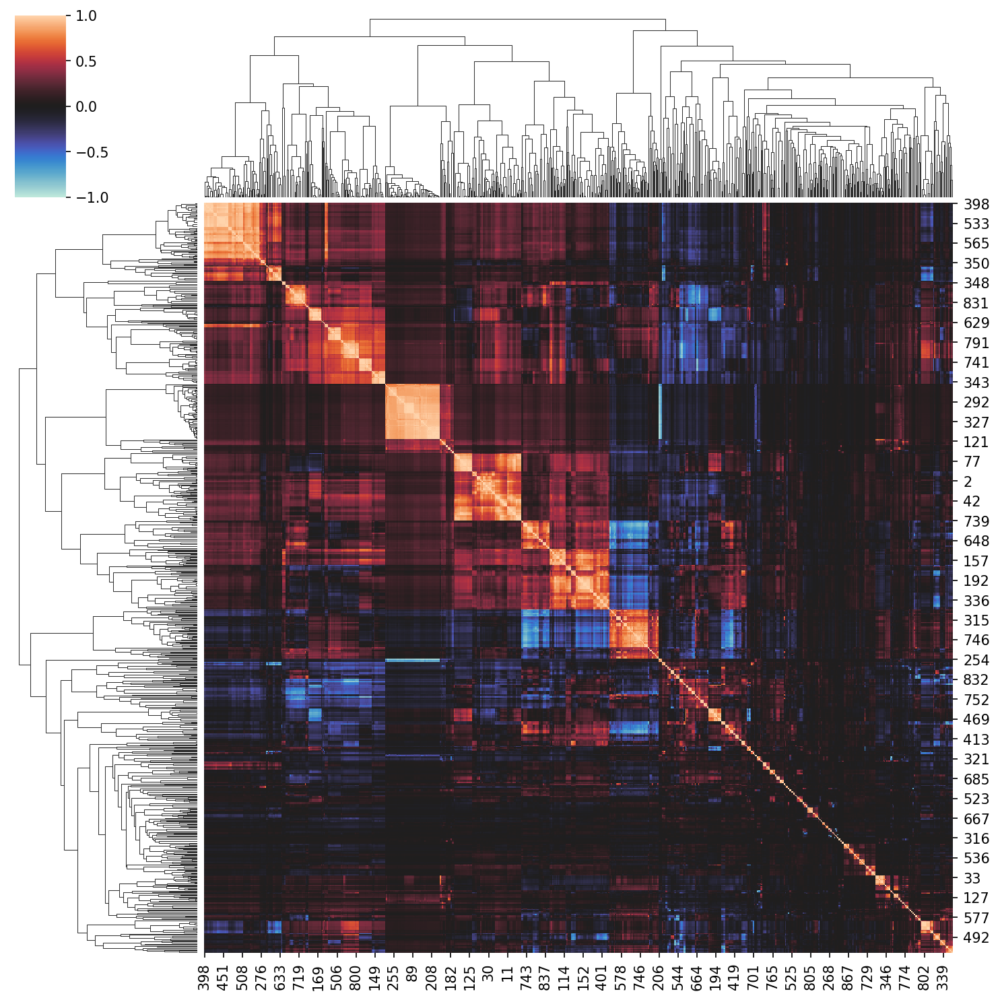

In [109]:
seaborn.clustermap(corr, vmin=-1, vmax=1, center=0)

In [110]:
# Ensure the correlation matrix is symmetric
corr = (corr + corr.T) / 2
numpy.fill_diagonal(corr, 1)

# We convert the correlation matrix to a distance matrix before performing
# hierarchical clustering using Ward's linkage.
distance_matrix = 1 - numpy.abs(corr)
dist_linkage = hierarchy.ward(squareform(distance_matrix))

In [111]:
clusters = fcluster(dist_linkage, 0.1, criterion="distance").ravel().tolist()
indices = [clusters.index(c) for c in numpy.unique(clusters)]
features = [adata_ctrl.var_names[i] for i in indices]

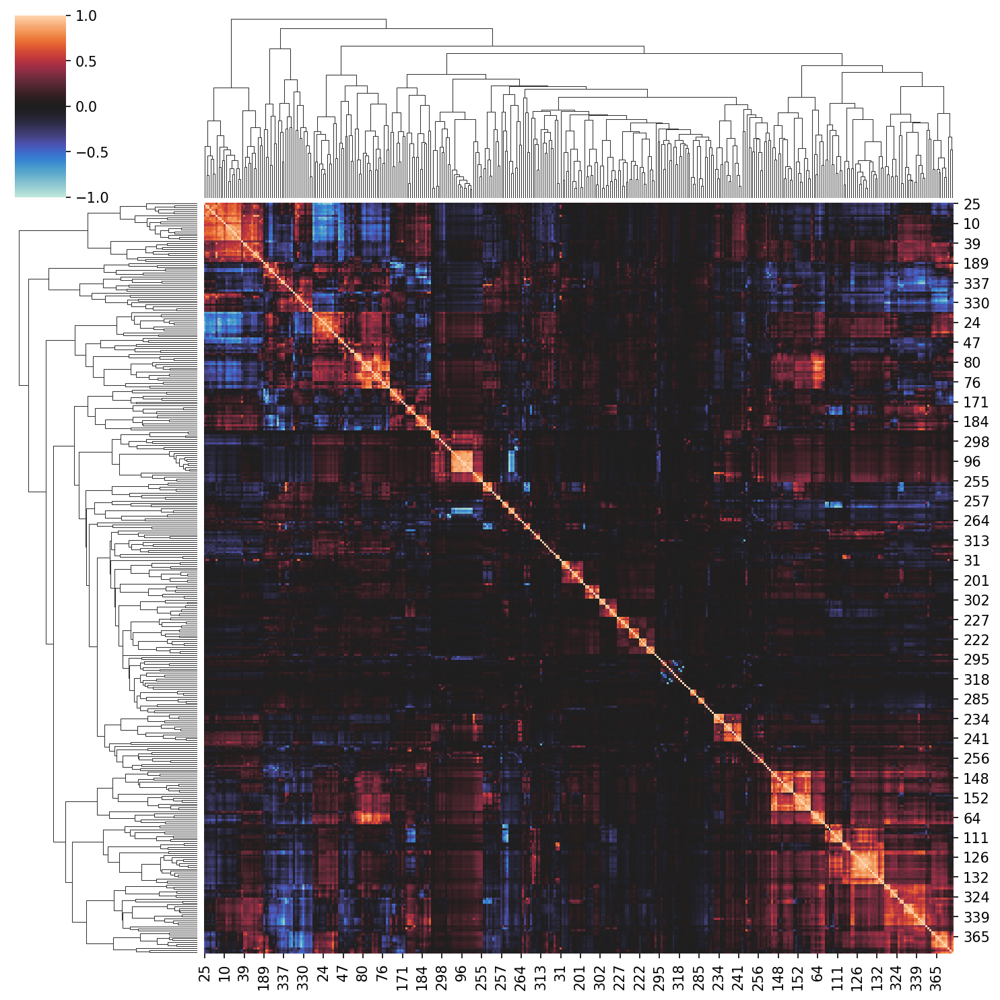

In [112]:
seaborn.clustermap(corr[indices, :][:, indices], vmin=-1, vmax=1, center=0)

In [113]:
rand_indices = numpy.random.randint(len(corr), size=len(indices))
numpy.median(corr[rand_indices, :][:, rand_indices][numpy.tril_indices(len(indices), k=-1)])

0.027643327797718015

In [114]:
post_corr = numpy.median(corr[indices, :][:, indices][numpy.tril_indices(len(indices), k=-1)])
post_corr

0.010759097492516221

In [115]:
(pre_corr - post_corr) / pre_corr

0.6500308805082498

In [116]:
len(features) / len(corr)

0.435632183908046

In [117]:
adata_ctrl.var["selected_corr"] = False
adata_ctrl.var.loc[features, "selected_corr"] = True

In [119]:
adata_inf.var["selected_corr"] = False
adata_inf.var.loc[features, "selected_corr"] = True

# Dimensionality reduction and clustering of ctrl samples

In [29]:
adata_ctrl_scaled = scanpy.pp.scale(adata_ctrl[:, adata_ctrl.var.selected_corr], copy=True)

In [30]:
scanpy.tl.pca(adata_ctrl_scaled, random_state=0)

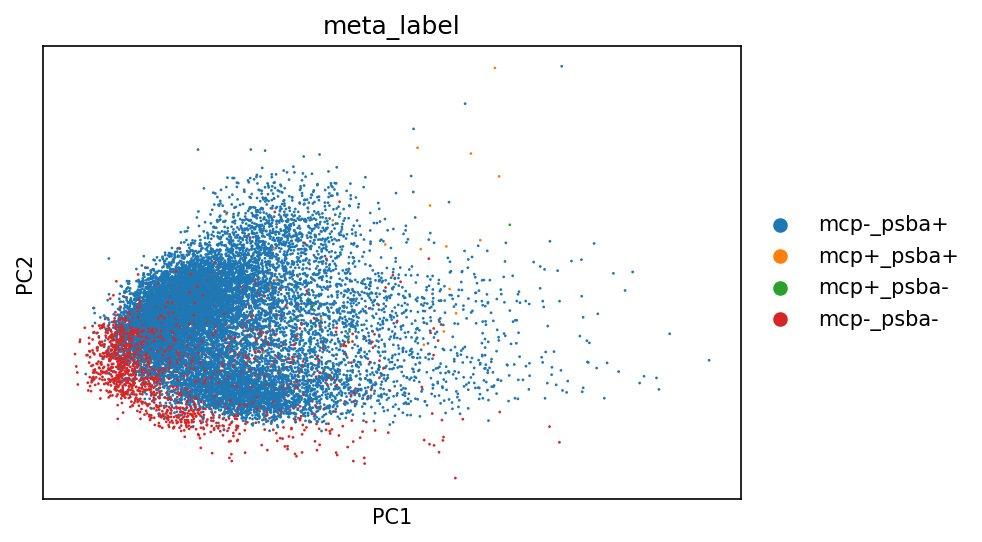

In [31]:
scanpy.pl.pca(adata_ctrl_scaled, color="meta_label")

In [41]:
%%time
scanpy.pp.neighbors(adata_ctrl_scaled, n_neighbors=20, random_state=0)

scanpy.tl.leiden(adata_ctrl_scaled, resolution=1.5, random_state=0)

scanpy.tl.paga(adata_ctrl_scaled)
scanpy.pl.paga(adata_ctrl_scaled, plot=False, add_pos=True)

scanpy.tl.umap(adata_ctrl_scaled, min_dist=0.1, init_pos="paga", random_state=0)

CPU times: user 26.9 s, sys: 58 ms, total: 26.9 s
Wall time: 27 s


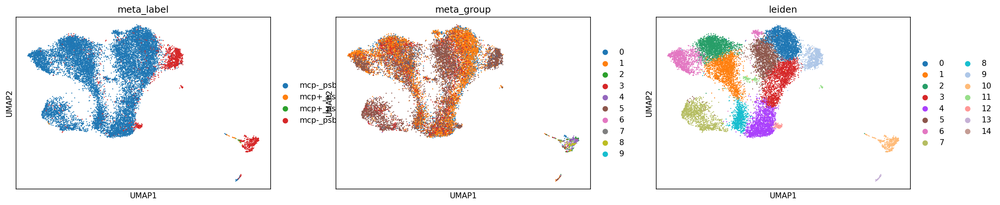

In [42]:
scanpy.pl.umap(adata_ctrl_scaled, color=['meta_label', 'meta_group', 'leiden'])

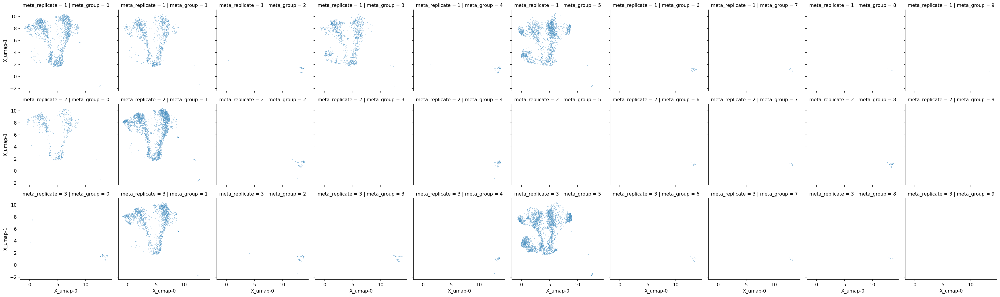

In [43]:
tmp_df = scanpy.get.obs_df(
    adata_ctrl_scaled,
    keys=["meta_group", "meta_replicate"],
    obsm_keys=[("X_umap", 0), ("X_umap", 1)]
)

grid = seaborn.FacetGrid(data=tmp_df, row="meta_replicate", col="meta_group")
grid.map_dataframe(seaborn.scatterplot, x="X_umap-0", y="X_umap-1", s=2, alpha=0.5, edgecolors="none")

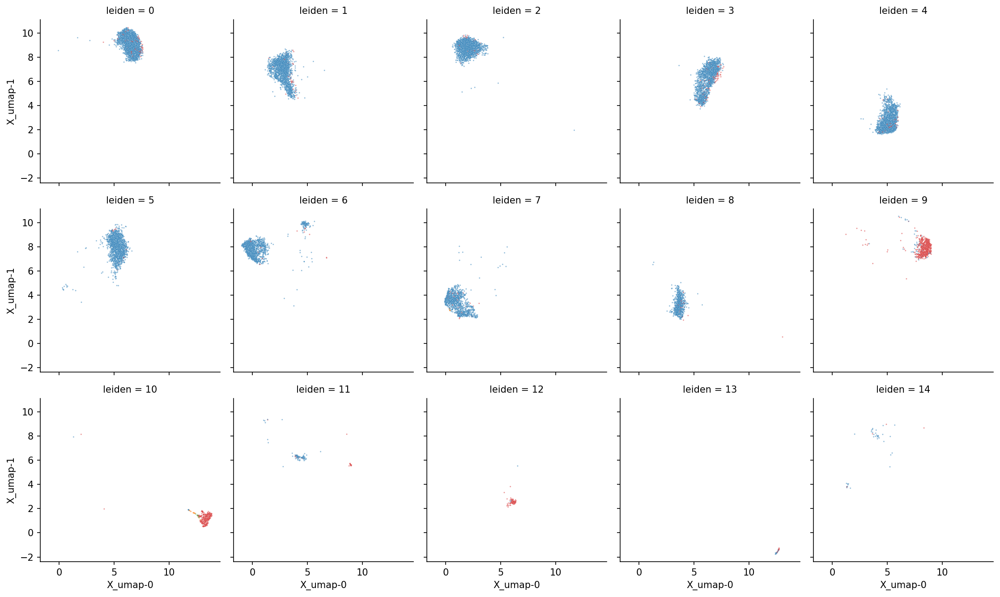

In [44]:
tmp_df = scanpy.get.obs_df(
    adata_ctrl_scaled,
    keys=["leiden", "meta_label"],
    obsm_keys=[("X_umap", 0), ("X_umap", 1)]
)

grid = seaborn.FacetGrid(data=tmp_df, col="leiden", col_wrap=5)
grid.map_dataframe(seaborn.scatterplot, x="X_umap-0", y="X_umap-1", hue="meta_label", s=2, alpha=0.5, edgecolors="none")

<AxesSubplot:xlabel='count', ylabel='meta_group'>

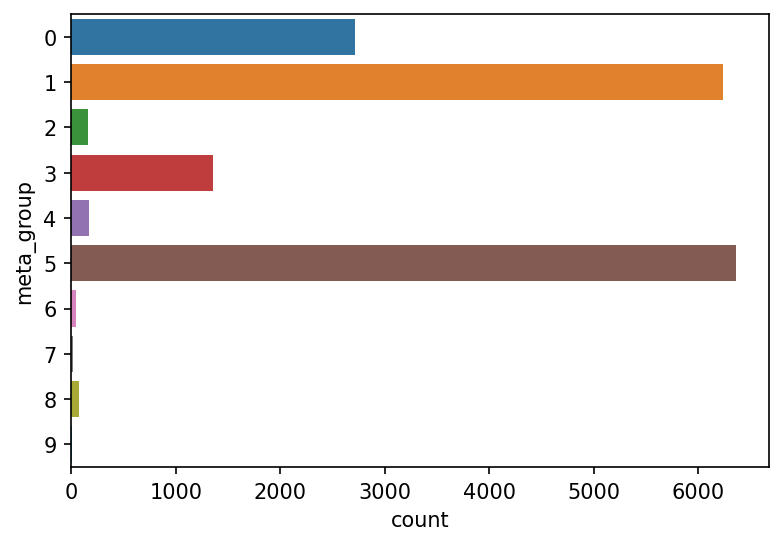

In [74]:
seaborn.countplot(data=adata_ctrl_scaled.obs, y="meta_group")

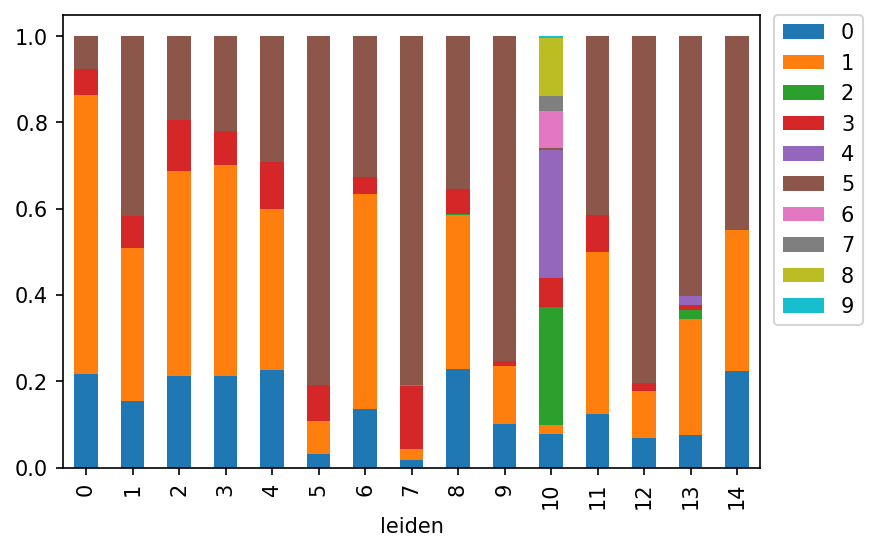

In [73]:
frac_df = (adata_ctrl_scaled.obs.reset_index(drop=True).groupby(["leiden", "meta_group"]).size() / adata_ctrl_scaled.obs.reset_index(drop=True).groupby("leiden").size()).to_frame(name="frac")
ax = frac_df.reset_index().pivot(index="leiden", columns="meta_group", values="frac").plot.bar(stacked=True)
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

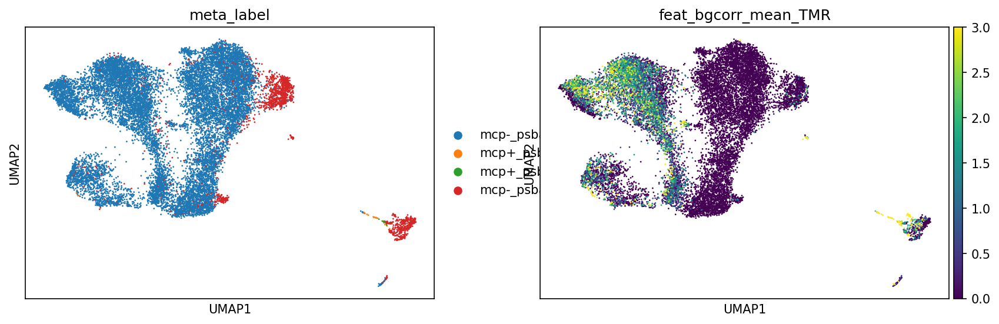

In [65]:
scanpy.pl.umap(adata_ctrl_scaled, color=['meta_label', 'feat_bgcorr_mean_TMR'], vmin=0, vmax=3)

Based on the above plots, we think it is best to discard control samples 2, 4, 6, 7, 8 and 9. They only occur in a split off population of dead cells, which seems to be driven by batch effects. These controls also hardly contain any healthy cells.

# Dimensionality reduction and clustering of infected samples

In [120]:
adata_inf_scaled = scanpy.pp.scale(adata_inf[:, adata_inf.var.selected_corr], copy=True)

In [123]:
scanpy.tl.pca(adata_inf_scaled, random_state=0)

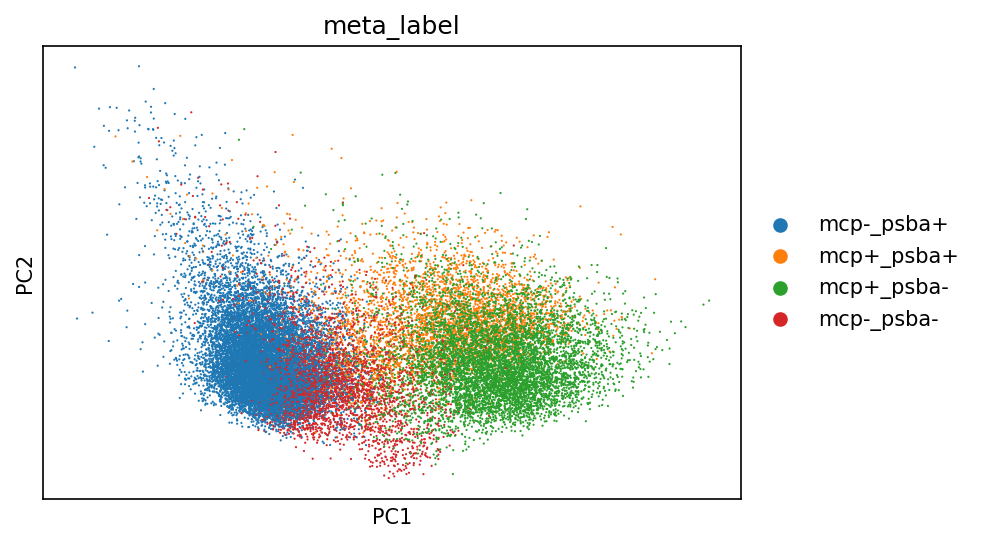

In [124]:
scanpy.pl.pca(adata_inf_scaled, color="meta_label")

In [131]:
%%time
scanpy.pp.neighbors(adata_inf_scaled, n_neighbors=20, random_state=0)

scanpy.tl.leiden(adata_inf_scaled, resolution=1.5, random_state=0)

scanpy.tl.paga(adata_inf_scaled)
scanpy.pl.paga(adata_inf_scaled, plot=False, add_pos=True)

scanpy.tl.umap(adata_inf_scaled, min_dist=0.1, init_pos="paga", random_state=0)

CPU times: user 44 s, sys: 86 ms, total: 44 s
Wall time: 44.2 s


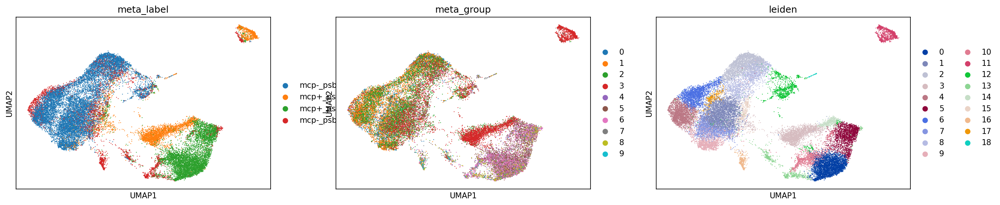

In [132]:
scanpy.pl.umap(adata_inf_scaled, color=['meta_label', 'meta_group', 'leiden'])

<AxesSubplot:xlabel='count', ylabel='meta_group'>

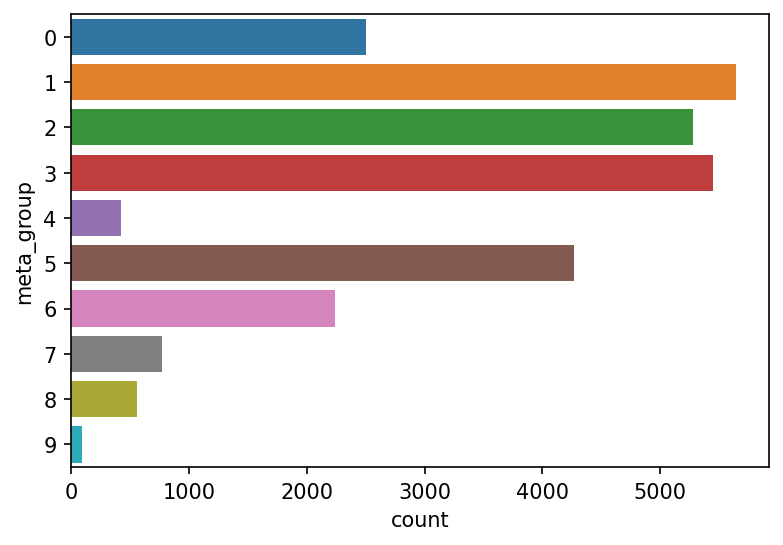

In [133]:
seaborn.countplot(data=adata_inf_scaled.obs, y="meta_group")

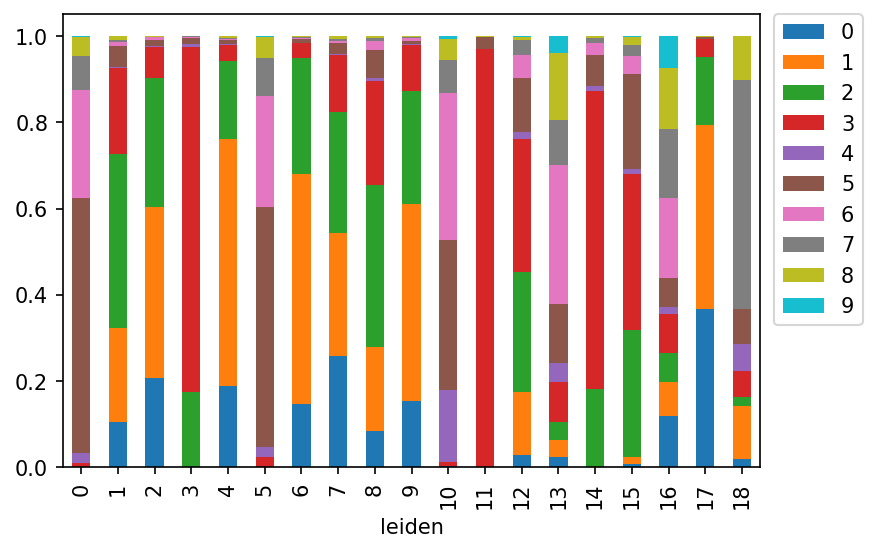

In [134]:
frac_df = (adata_inf_scaled.obs.reset_index(drop=True).groupby(["leiden", "meta_group"]).size() / adata_inf_scaled.obs.reset_index(drop=True).groupby("leiden").size()).to_frame(name="frac")
ax = frac_df.reset_index().pivot(index="leiden", columns="meta_group", values="frac").plot.bar(stacked=True)
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

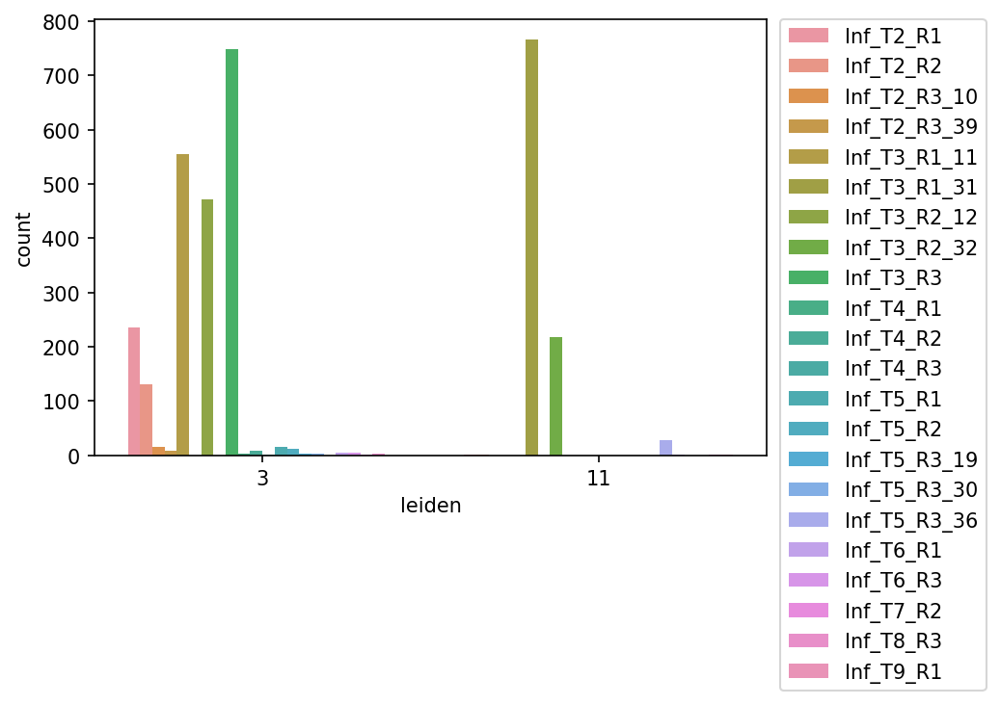

In [145]:
ax = seaborn.countplot(data=adata_inf_scaled[adata_inf_scaled.obs["leiden"].isin(['3', '11'])].obs, x="leiden", hue="meta_sample")
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

In [150]:
(adata_inf_scaled.obs[adata_inf_scaled.obs["leiden"] == '11']["meta_sample"].value_counts() / adata_inf_scaled.obs["meta_sample"].value_counts()).sort_values()

Inf_T0_R1       0.000000
Inf_T8_R2       0.000000
Inf_T8_R1       0.000000
Inf_T7_R3       0.000000
Inf_T7_R2       0.000000
Inf_T6_R3       0.000000
Inf_T6_R2       0.000000
Inf_T5_R3_30    0.000000
Inf_T5_R3_19    0.000000
Inf_T5_R2       0.000000
Inf_T5_R1       0.000000
Inf_T4_R3       0.000000
Inf_T9_R2       0.000000
Inf_T4_R1       0.000000
Inf_T4_R2       0.000000
Inf_T9_R3       0.000000
Inf_T3_R2_12    0.000000
Inf_T0_R1_2     0.000000
Inf_T3_R1_11    0.000000
Inf_T2_R3_39    0.000000
Inf_T2_R3_10    0.000000
Inf_T0_R3       0.000000
Inf_T1_R1       0.000000
Inf_T1_R2       0.000000
Inf_T3_R3       0.000000
Inf_T1_R3       0.000000
Inf_T2_R1       0.000437
Inf_T2_R2       0.000929
Inf_T6_R1       0.001477
Inf_T8_R3       0.002890
Inf_T9_R1       0.030303
Inf_T5_R3_36    0.903226
Inf_T3_R2_32    0.960352
Inf_T3_R1_31    0.972081
Name: meta_sample, dtype: float64

From the above we can conclude that Inf_T5_R3_36, Inf_T3_R2_32 and Inf_T3_R1_31 should be removed from the analysis. There are also a couple of outlier cells that should be removed.

# Dimensionality reduction and clustering of ctrl and infected samples

In [89]:
adata = adata[~(adata.obs["meta_group"].isin([2, 4, 6, 7, 8, 9]) & (adata.obs["meta_type"] == "Ctrl"))]

In [153]:
adata = adata[~adata.obs["meta_sample"].isin(['Inf_T5_R3_36', 'Inf_T3_R2_32', 'Inf_T3_R1_31'])]

In [178]:
adata_inf_scaled[(adata_inf_scaled.obs["leiden"] == '11') & adata_inf_scaled.obs["meta_sample"].isin(["Inf_T2_R1", "Inf_T2_R2", "Inf_T6_R1", "Inf_T8_R3", "Inf_T9_R1"])]

View of AnnData object with n_obs × n_vars = 5 × 379
    obs: 'meta_path', 'meta_zarr_idx', 'meta_bbox_minr', 'meta_bbox_minc', 'meta_bbox_maxr', 'meta_bbox_maxc', 'meta_regions_BF1', 'meta_regions_TMR', 'meta_regions_SSC', 'meta_regions_DAPI', 'meta_regions_BF2', 'meta_regions_Cy5', 'meta_sample', 'meta_label', 'meta_TMR+_ctrl', 'meta_type', 'meta_object_number', 'meta_replicate', 'meta_suffix', 'meta_group', 'leiden'
    var: 'selected_corr', 'mean', 'std'
    uns: 'pca', 'meta_label_colors', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'meta_group_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [154]:
adata_scaled = scanpy.pp.scale(adata[:, adata_ctrl.var.selected_corr], copy=True)

In [155]:
scanpy.tl.pca(adata_scaled, random_state=0)

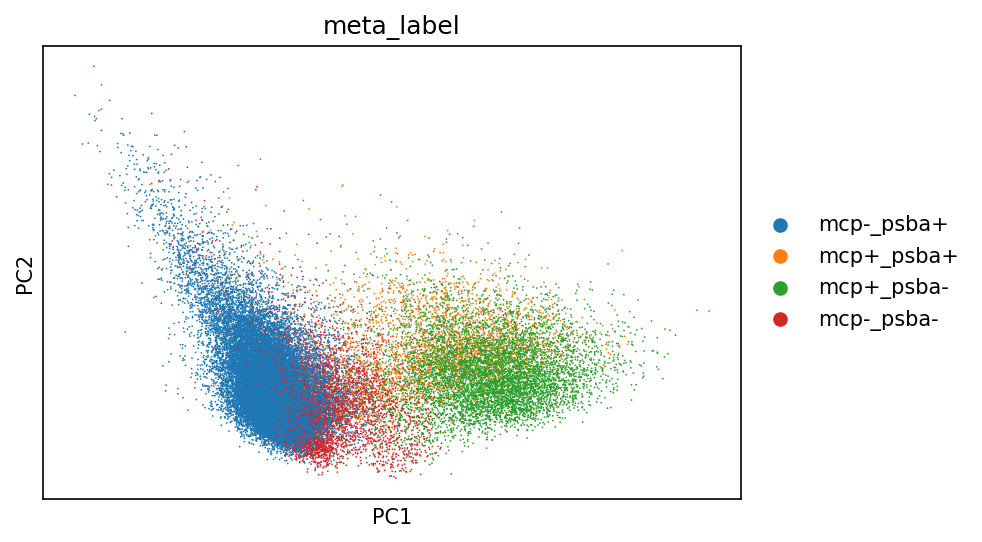

In [156]:
scanpy.pl.pca(adata_scaled, color="meta_label")

In [163]:
%%time
scanpy.pp.neighbors(adata_scaled, n_neighbors=20, random_state=0)

scanpy.tl.leiden(adata_scaled, resolution=2, random_state=0)

scanpy.tl.paga(adata_scaled)
scanpy.pl.paga(adata_scaled, plot=False, add_pos=True)

scanpy.tl.umap(adata_scaled, min_dist=0.1, init_pos="paga", random_state=0)

CPU times: user 1min 29s, sys: 155 ms, total: 1min 29s
Wall time: 1min 30s


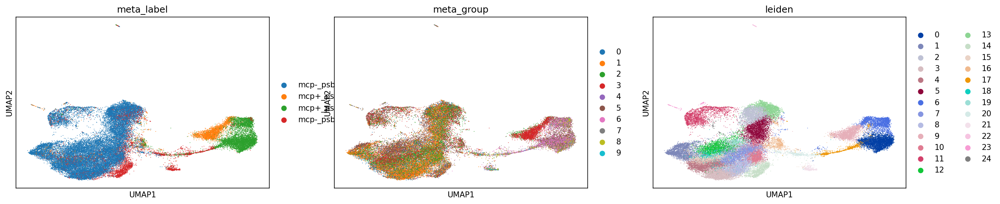

In [164]:
scanpy.pl.umap(adata_scaled, color=['meta_label', 'meta_group', 'leiden'])

In [165]:
means = adata.to_df().merge(scanpy.get.obs_df(adata_scaled, keys="leiden"), left_index=True, right_index=True).groupby("leiden").mean()

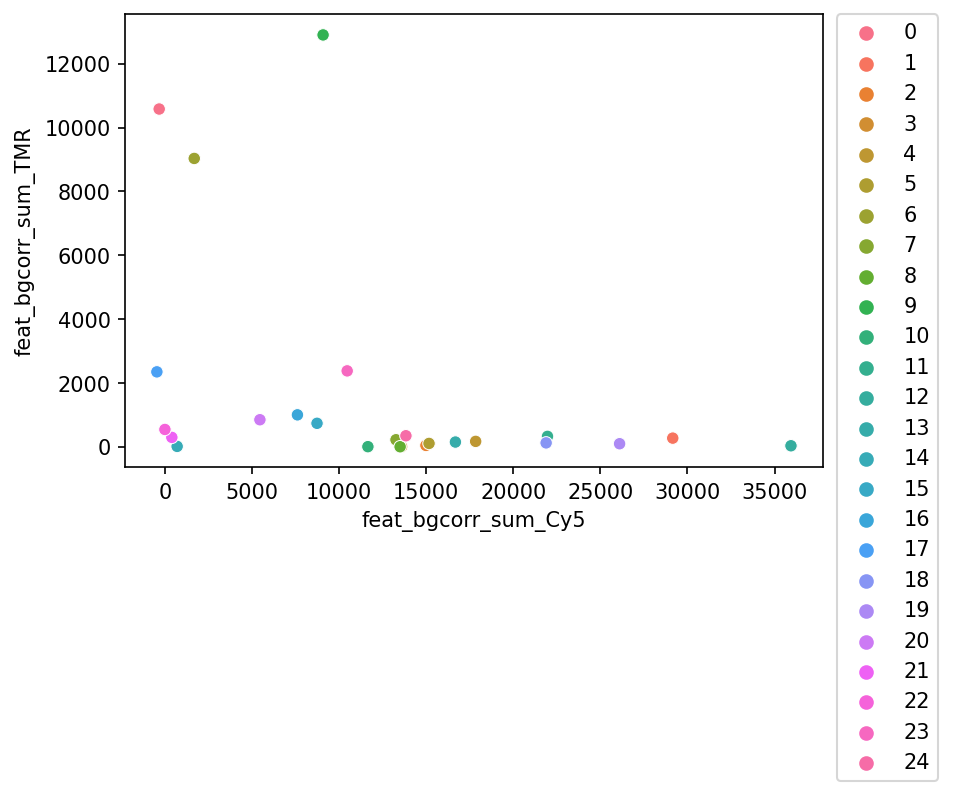

In [166]:
ax = seaborn.scatterplot(data=means.reset_index(), x="feat_bgcorr_sum_Cy5", y="feat_bgcorr_sum_TMR", hue='leiden')
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

<AxesSubplot:xlabel='leiden'>

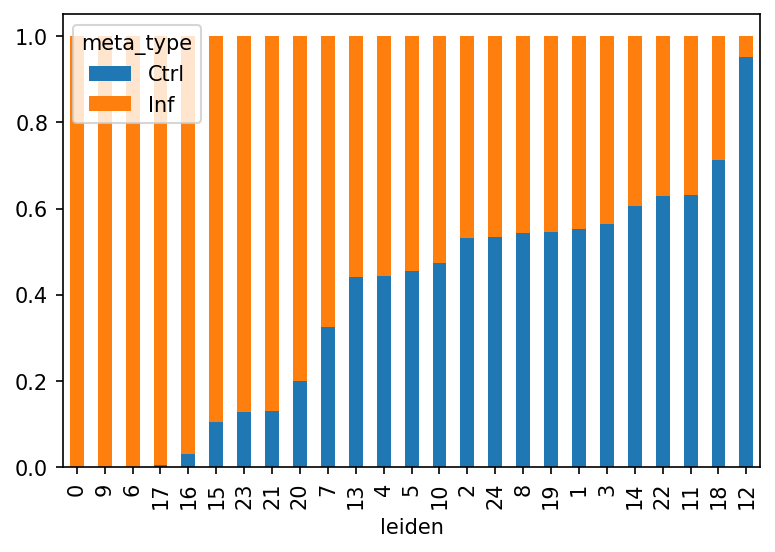

In [167]:
frac_df = (adata_scaled.obs.reset_index(drop=True).groupby(["leiden", "meta_type"]).size() / adata_scaled.obs.groupby("leiden").size()).to_frame(name="frac")
frac_df.reset_index().pivot(index="leiden", columns="meta_type", values="frac").sort_values("Ctrl").plot.bar(stacked=True)

<AxesSubplot:xlabel='leiden'>

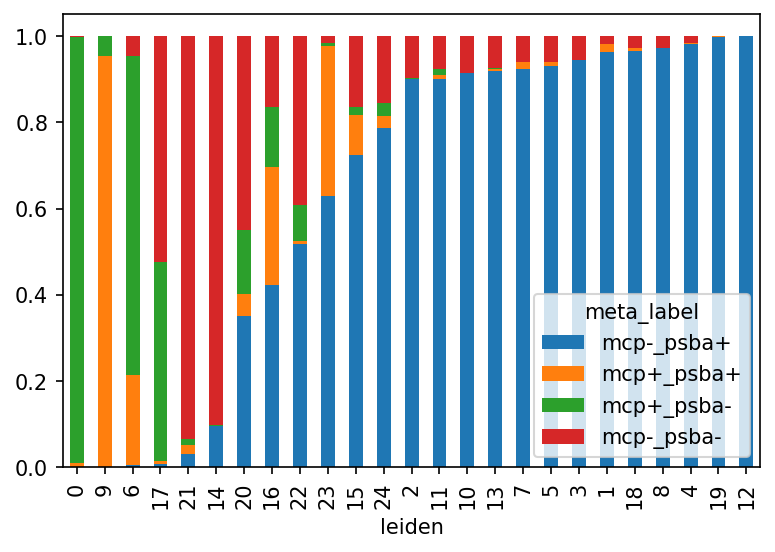

In [168]:
frac_df = (adata_scaled.obs.groupby(["leiden", "meta_label"]).size() / adata_scaled.obs.groupby("leiden").size()).to_frame(name="frac")
frac_df.reset_index().pivot(index="leiden", columns="meta_label", values="frac").sort_values("mcp-_psba+").plot.bar(stacked=True)

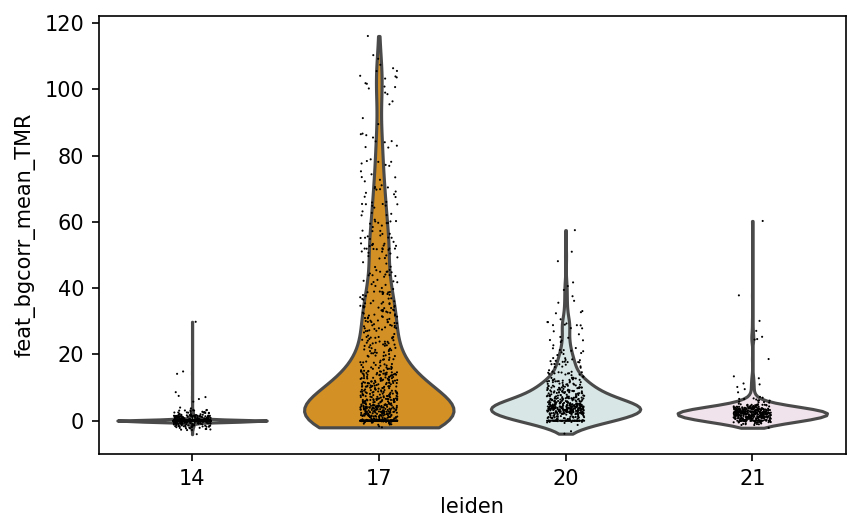

In [174]:
scanpy.pl.violin(adata_scaled[adata_scaled.obs["leiden"].isin(['21', '14', '17', '20'])], keys="feat_bgcorr_mean_TMR", groupby="leiden")

In [145]:
maj_label = frac_df.groupby("leiden").idxmax().frac.apply(lambda a: a[1])

In [146]:
adata2.obs["clust_type"] = adata2.obs["leiden"].map(lambda a: maj_label[a]).astype("category")

In [147]:
adata2.obs["clust_id"] = adata2.obs.apply(lambda r: "%s-%s" % (r["clust_type"], r["leiden"]), axis="columns")

In [148]:
"Purity: %.4f" % (adata2.obs.groupby(["leiden", "meta_label"]).size().groupby("leiden").max() / adata2.obs.groupby("leiden").size()).mean()

'Purity: 0.8178'

In [85]:
adata.obsm = adata2.obsm
adata.obs = adata2.obs


AnnData expects .obs.index to contain strings, but got values like:
    [('Ctrl', 21766, 3, nan, 5), ('Ctrl', 19432, 3, nan, 5), ('Ctrl', 16719, 3, nan, 5), ('Ctrl', 19692, 3, nan, 5), ('Ctrl', 17745, 3, nan, 5)]

    Inferred to be: mixed



In [86]:
adata.obs = adata.obs.reset_index(drop=True)

In [167]:
adata.write(data_dir / "analysis.h5ad")

## Zooming in on structures

### Elevated side-scatter/darkfield signal (potentional stationary cels)

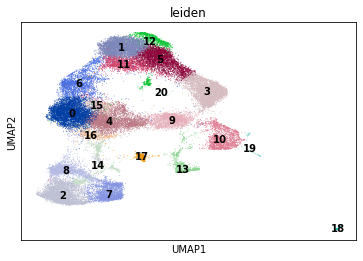

In [ ]:
scanpy.pl.umap(adata, color='leiden', legend_loc="on data")

<AxesSubplot:xlabel='leiden', ylabel='feat_bgcorr_max_SSC'>

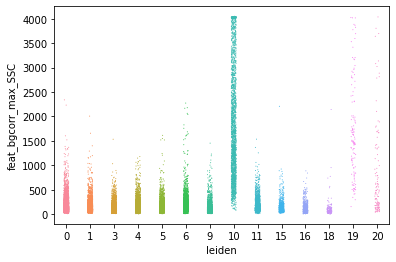

In [ ]:
seaborn.stripplot(
    data = scanpy.get.obs_df(adata[adata.obs["clust_type"] == "mcp-_psba+"], keys=["feat_bgcorr_max_SSC", "leiden"]),
    y="feat_bgcorr_max_SSC",
    x="leiden",
    s=1
)

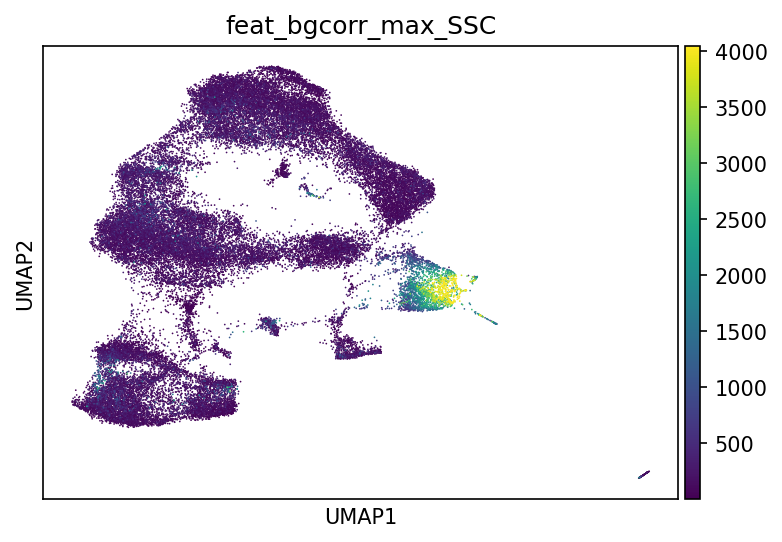

In [164]:
scanpy.pl.umap(adata, color='feat_bgcorr_max_SSC')

<AxesSubplot:xlabel='leiden', ylabel='count'>

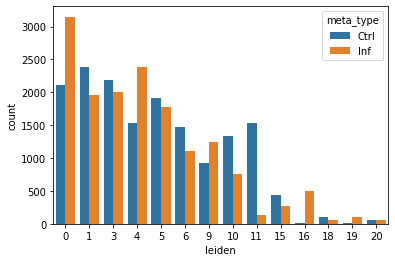

In [ ]:
seaborn.countplot(
    data = scanpy.get.obs_df(adata[adata.obs["clust_type"] == "mcp-_psba+"], keys=["meta_type", "leiden"]),
    hue="meta_type",
    x="leiden"
)

In [ ]:
tmp_df = scanpy.get.obs_df(adata[adata.obs["clust_type"] == "mcp-_psba+"], keys=["feat_bgcorr_max_SSC", "leiden"])
clusters = tmp_df.groupby("leiden")["feat_bgcorr_max_SSC"].mean().sort_values().index[-2:]
clusters

CategoricalIndex(['19', '10'], categories=['0', '1', '3', '4', '5', '6', '9', '10', ...], ordered=False, dtype='category', name='leiden')

<AxesSubplot:xlabel='leiden', ylabel='count'>

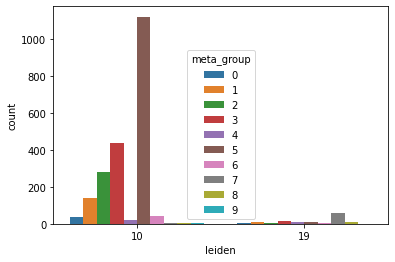

In [ ]:
seaborn.countplot(
    data = scanpy.get.obs_df(adata[adata.obs["leiden"].isin(clusters)], keys=["meta_group", "leiden"]),
    hue="meta_group",
    x="leiden"
)

### Dead cells

In [106]:
adata_dead = adata[adata.obs["leiden"] == '17'].copy()

Transforming to str index.


In [107]:
%%time
scanpy.pp.neighbors(adata_dead, n_neighbors=5, random_state=0)

scanpy.tl.leiden(adata_dead, resolution=1, random_state=0)

scanpy.tl.paga(adata_dead)
scanpy.pl.paga(adata_dead, plot=False, add_pos=True)

scanpy.tl.umap(adata_dead, min_dist=0, init_pos="paga", random_state=0)

CPU times: user 3.67 s, sys: 7.76 ms, total: 3.68 s
Wall time: 3.7 s


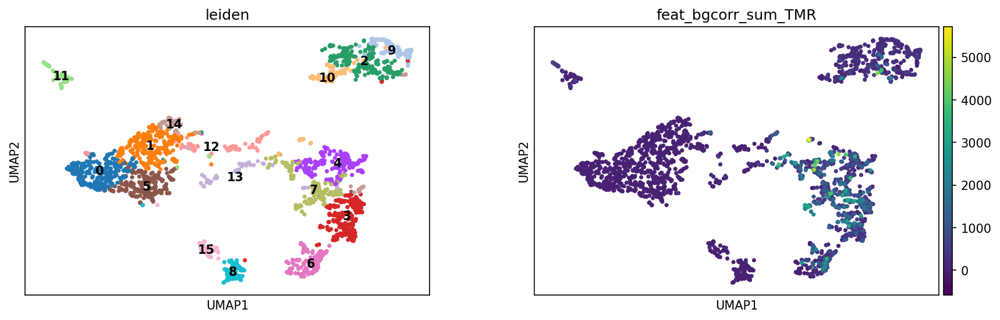

In [108]:
scanpy.pl.umap(adata_dead, color=['leiden', 'feat_bgcorr_sum_TMR'], legend_loc="on data")

In [151]:
adata.obs["dead"] = adata.obs.leiden.map(lambda a: a if a in adata[adata.obs.clust_type == "mcp-_psba-"].obs.leiden.unique() else "0")

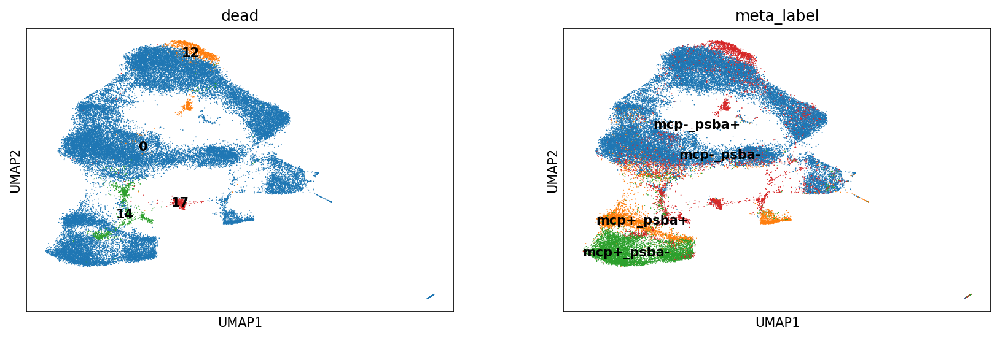

In [152]:
scanpy.pl.umap(adata, color=['dead', 'meta_label'], legend_loc="on data")

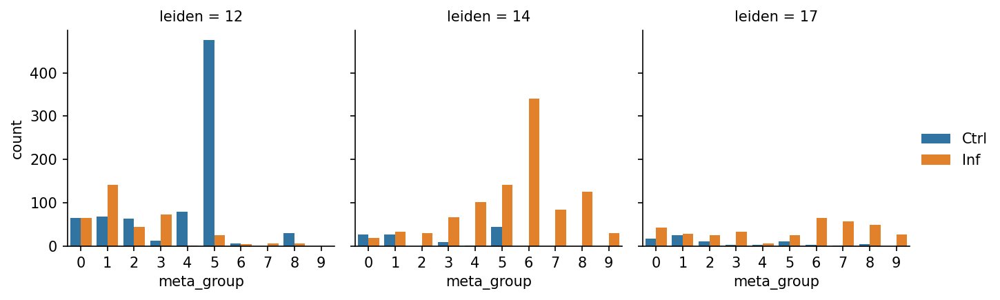

In [153]:
tmp_df = adata.obs[adata.obs["clust_type"] == "mcp-_psba-"].copy()
tmp_df["leiden"] = tmp_df["leiden"].astype(str)

grid = seaborn.FacetGrid(data=tmp_df, col="leiden")
grid.map_dataframe(seaborn.countplot, x="meta_group", hue="meta_type", palette="tab10")
grid.add_legend()

#### Explanation full spec

In [260]:
X = adata[adata.obs["clust_type"] == "mcp-_psba-", adata.var.selected_corr].to_df()
y = adata[adata.obs["clust_type"] == "mcp-_psba-", adata.var.selected_corr].obs["leiden"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, stratify=y)

rf = RandomForestClassifier(n_estimators = 100).fit(X_train, y_train)
metrics.balanced_accuracy_score(rf.predict(X_test), y_test)

0.9882351220511021

In [261]:
numpy.random.seed(0)
explainer = shap.TreeExplainer(rf)
shap_values = explainer(X_test)

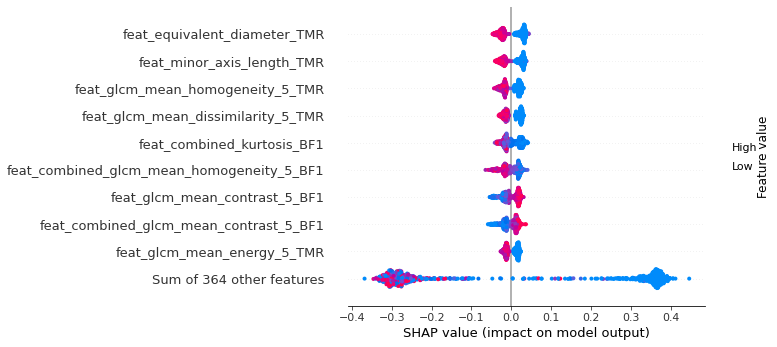

In [262]:
idx = numpy.argsort(shap_values[..., 0].abs.mean(axis=0).values)[::-1]
shap.plots.beeswarm(copy.deepcopy(shap_values[..., 0]), order=idx)

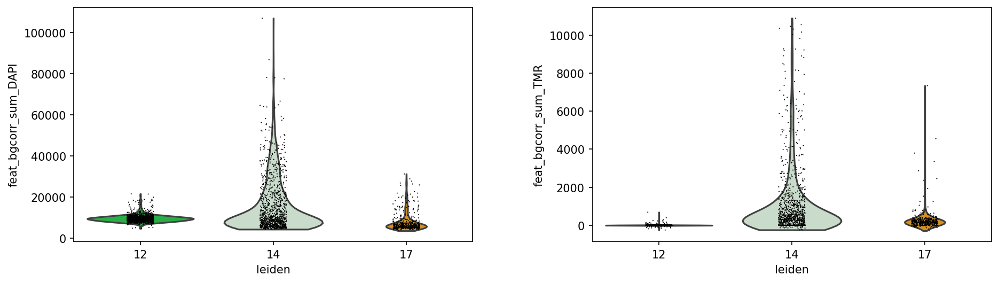

In [184]:
scanpy.pl.violin(
    adata[adata.obs["clust_type"] == "mcp-_psba-"], 
    keys=["feat_bgcorr_sum_DAPI", "feat_bgcorr_sum_TMR"], 
    groupby="leiden", scale="count")

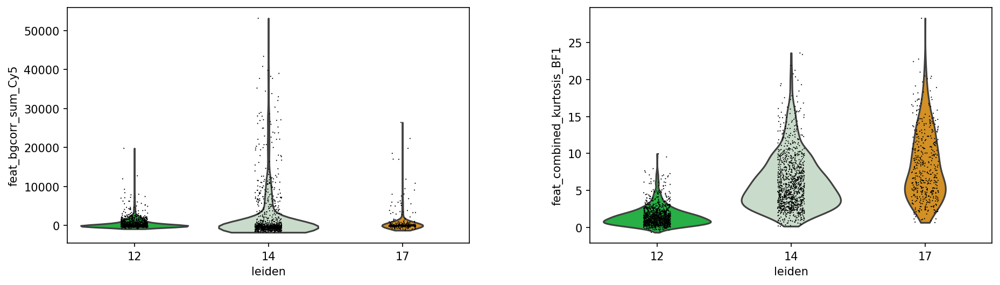

In [185]:
scanpy.pl.violin(
    adata[adata.obs["clust_type"] == "mcp-_psba-"], 
    keys=["feat_bgcorr_sum_Cy5", "feat_combined_kurtosis_BF1"], 
    groupby="leiden", scale="count")

In [189]:
%%time
r = permutation_importance(
    rf,
    X_test, y_test, 
    scoring="balanced_accuracy",
    n_jobs=16, n_repeats=10, 
    random_state=0
)

CPU times: user 10.7 s, sys: 1.1 s, total: 11.8 s
Wall time: 3min 18s


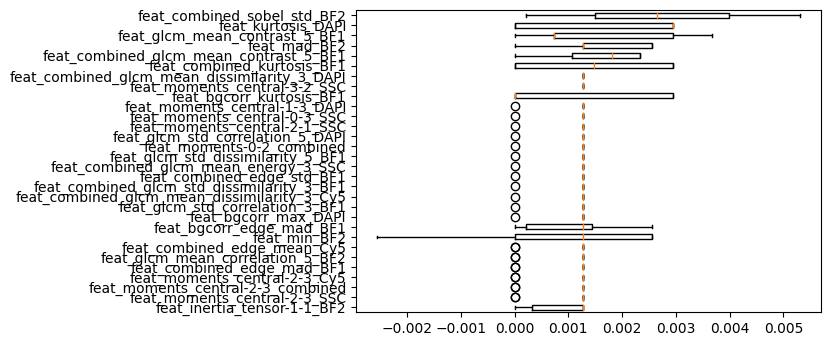

In [190]:
perm_sorted_idx = r.importances_mean.argsort()[-30:]

fig, ax = plt.subplots(1, dpi=100)
ax.boxplot(
    r.importances[perm_sorted_idx].T,
    vert=False,
    labels=X_test.columns[perm_sorted_idx],
);

In [191]:
def func(a):
    i = a.rfind("_")+1
    return a[i:] + "_" + a[:i-1]
sort = numpy.argsort(list(map(func, X_test.columns[perm_sorted_idx])))

In [192]:
var_group = {}
first = {}
for i, v in enumerate(sorted(list(map(lambda a: a.split("_")[-1], X_test.columns[perm_sorted_idx])))):
    var_group[v] = var_group.get(v, 0) + 1
    if v not in first:
        first[v] = i
    
var_group_positions = [(first[k], first[k] + v - 1) for k,v in var_group.items()]

In [193]:
def func(a):
    i = a.rfind("_")
    a = a[len("feat_"):i]
    a = a.replace("_", " ")
    return a
adata.var["friendly_name"] = adata.var_names.map(func)

In [195]:
adata.layers['scaled'] = normalization.qq(adata.to_df(), (0.01, 0.99))

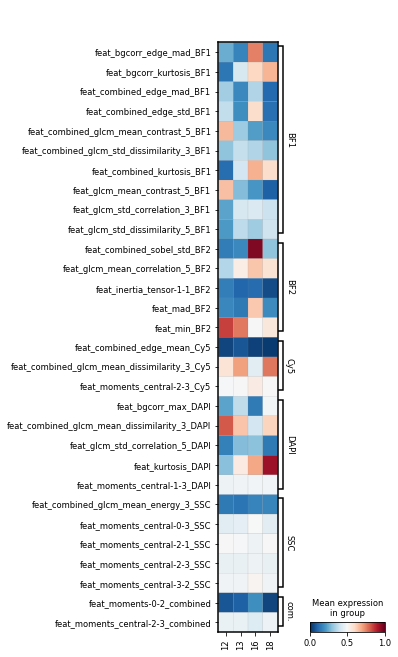

In [197]:
scanpy.pl.matrixplot(
    adata[adata.obs["clust_type"] == "mcp-_psba-"], 
    var_names=X_test.columns[perm_sorted_idx][sort],
    var_group_positions=var_group_positions,
    var_group_labels=list(first.keys()),
    groupby="leiden",
    layer='scaled', 
    vmin=0, vmax=1, cmap='RdBu_r',
    swap_axes=True
)

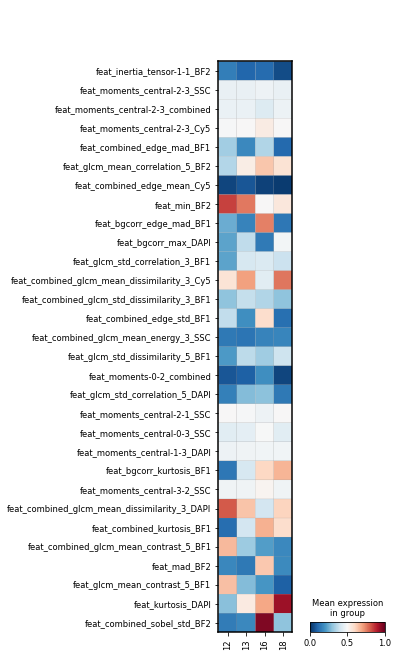

In [199]:
scanpy.pl.matrixplot(
    adata[adata.obs["clust_type"] == "mcp-_psba-"], 
    var_names=X_test.columns[perm_sorted_idx],
    groupby="leiden",
    layer='scaled', 
    vmin=0, vmax=1, cmap='RdBu_r',
    swap_axes=True
)

#### Explanation reduced spec

In [264]:
cols = adata.var[adata.var.selected_corr].T.filter(regex="(BF|SSC|DAPI)").columns

X = adata[adata.obs["clust_type"] == "mcp-_psba-", cols].to_df()
y = adata[adata.obs["clust_type"] == "mcp-_psba-", cols].obs["leiden"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.1, stratify=y)

rf = RandomForestClassifier(n_estimators = 100, oob_score=True).fit(X_train, y_train)
metrics.balanced_accuracy_score(rf.predict(X_test), y_test)

0.9627450283670304

In [265]:
numpy.random.seed(0)
explainer = shap.TreeExplainer(rf)
shap_values = explainer(X_test)

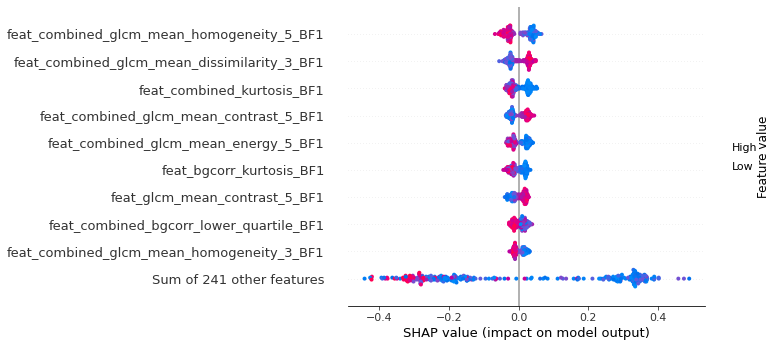

In [266]:
idx = numpy.argsort(shap_values[..., 0].abs.mean(axis=0).values)[::-1]
shap.plots.beeswarm(copy.deepcopy(shap_values[..., 0]), order=idx)

### +/+ clusters

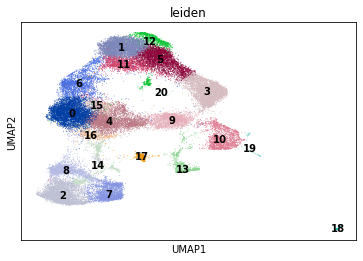

In [38]:
scanpy.pl.umap(adata2, color='leiden', legend_loc='on data')

In [39]:
adata.obs[adata.obs.clust_type == "mcp+_psba+"].leiden.unique()

['13', '8']
Categories (21, object): ['0', '1', '2', '3', ..., '17', '18', '19', '20']

In [479]:
X = adata[adata.obs["clust_type"] == "mcp+_psba+", adata.var.selected_corr].to_df()
y = adata[adata.obs["clust_type"] == "mcp+_psba+", adata.var.selected_corr].obs["leiden"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, stratify=y)

rf = RandomForestClassifier(n_estimators = 100).fit(X_train, y_train)
metrics.balanced_accuracy_score(rf.predict(X_test), y_test)

0.9850089435294724

In [480]:
%%time
r = permutation_importance(
    rf,
    X_test, y_test, 
    scoring="balanced_accuracy",
    n_jobs=16, n_repeats=10, 
    random_state=0
)

CPU times: user 9.96 s, sys: 411 ms, total: 10.4 s
Wall time: 3min 8s


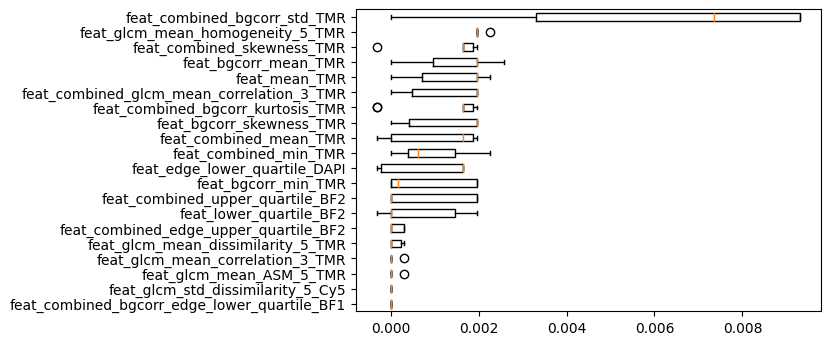

In [484]:
perm_sorted_idx = r.importances_mean.argsort()[-20:]

fig, ax = plt.subplots(1, dpi=100)
ax.boxplot(
    r.importances[perm_sorted_idx].T,
    vert=False,
    labels=X_test.columns[perm_sorted_idx],
);

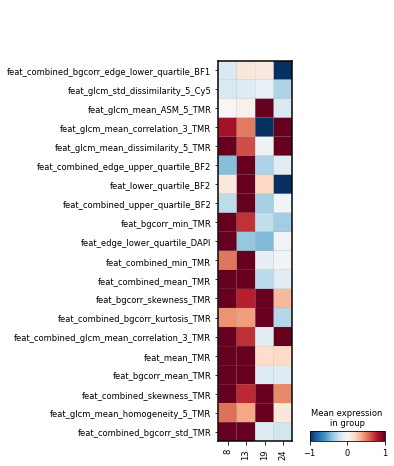

In [485]:
scanpy.pl.matrixplot(
    adata[adata.obs["clust_type"] == "mcp+_psba+"], 
    var_names=X_test.columns[perm_sorted_idx],
    groupby="leiden",
    layer='scaled', 
    vmin=-1, vmax=1, cmap='RdBu_r',
    swap_axes=True
)

### -/+ clusters

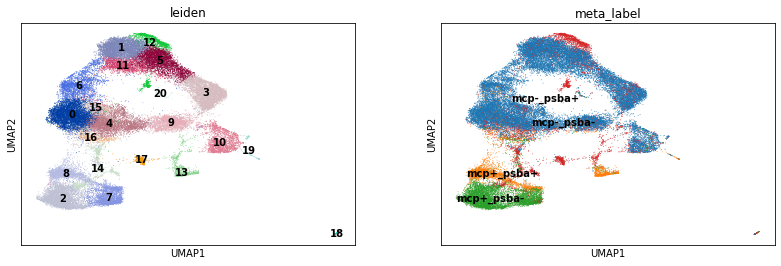

In [40]:
scanpy.pl.umap(adata, color=['leiden', 'meta_label'], legend_loc='on data')

In [41]:
adata.obs[adata.obs.clust_type == "mcp-_psba+"].leiden.unique().tolist()

['10', '1', '5', '3', '4', '11', '9', '6', '15', '18', '0', '20', '16', '19']

In [187]:
group1 = ["0", "4", "15", "9"]
group2 = ["3", "1", "11", "5"]
group3 = ["6"]

def func(a):
    if a in group1:
        return "1"
    elif a in group2:
        return "2"
    elif a in group3:
        return "3"
    else:
        return "0"

adata.obs["healthy_metaclust"] = adata.obs["leiden"].map(func)

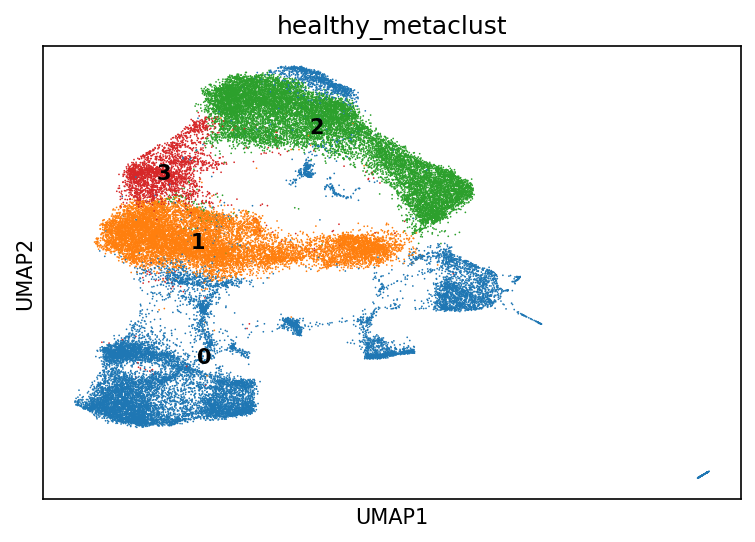

In [188]:
scanpy.pl.umap(adata, color=['healthy_metaclust'], legend_loc='on data')

In [58]:
%%time

X = adata[adata.obs.healthy_metaclust != "0"].X
target = adata[adata.obs.healthy_metaclust != "0"].obs.healthy_metaclust

mi = mutual_info_classif(X, target, n_neighbors=20, random_state=0)
mi = pandas.Series(mi, index=adata.var_names).sort_values(ascending=False)

CPU times: user 2min 38s, sys: 150 ms, total: 2min 39s
Wall time: 2min 40s


In [59]:
adata.layers['scaled'] = normalization.qq(adata.to_df(), (0.01, 0.99))

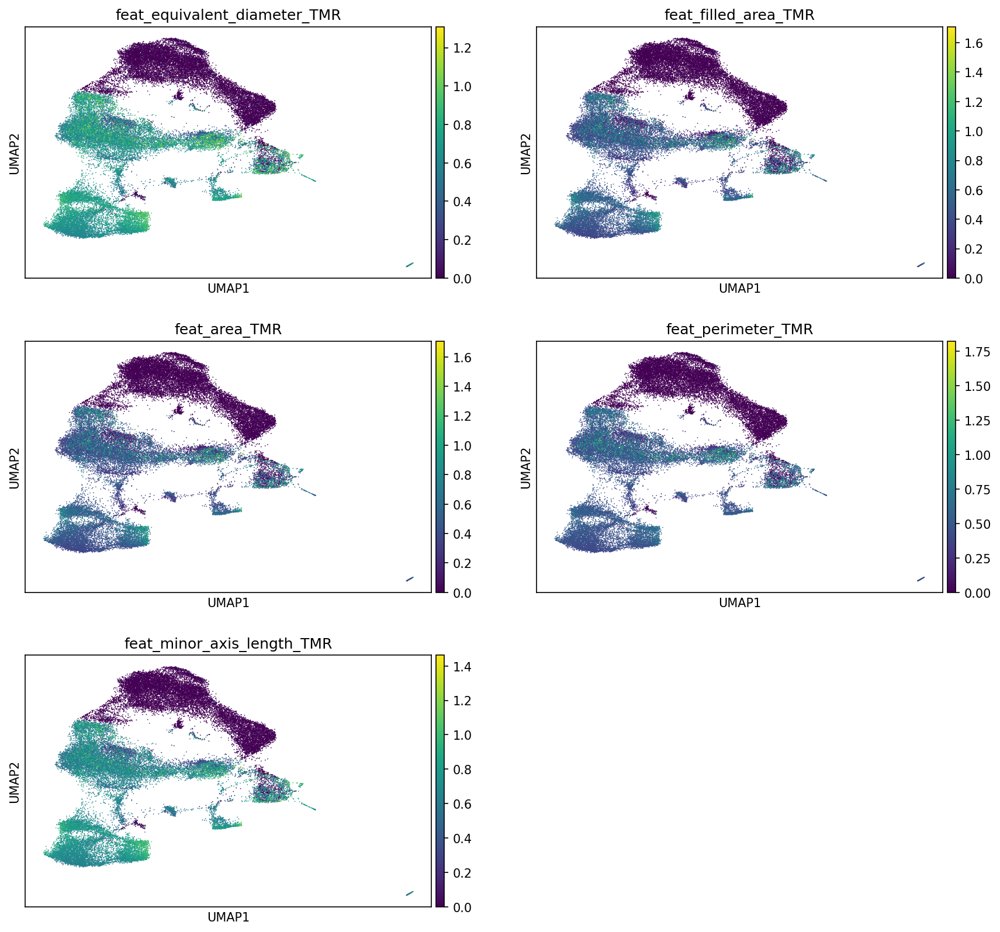

In [190]:
scanpy.pl.umap(adata, color=mi.index[:5], ncols=2, layer="scaled")

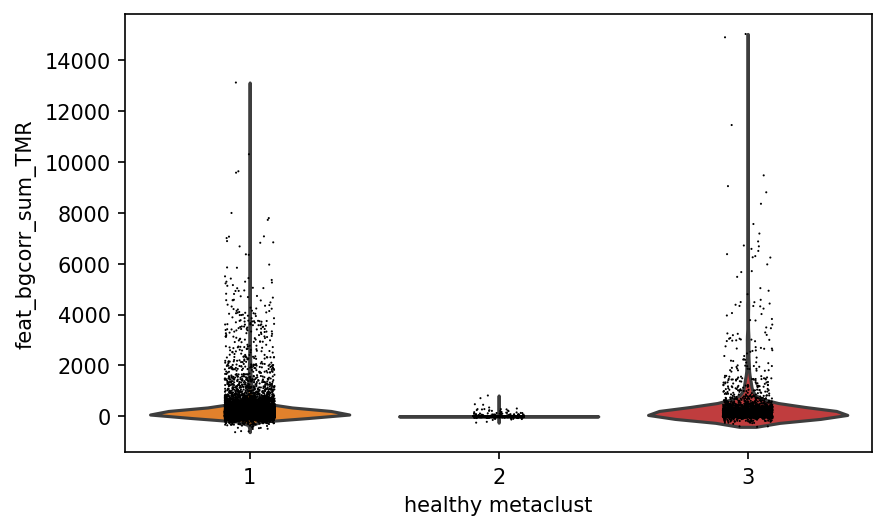

In [195]:
scanpy.pl.violin(adata[adata.obs.healthy_metaclust != "0"], keys=["feat_bgcorr_sum_TMR"], groupby="healthy_metaclust")

In [196]:
def func(a):
    return {
        "0": "other",
        "1": "TMR+ healthy",
        "2": "TMR- healthy",
        "3": "TMR+/TMR- healthy"
    }[a]

adata.obs["healthy_metaclust"] = adata.obs["healthy_metaclust"].map(func)

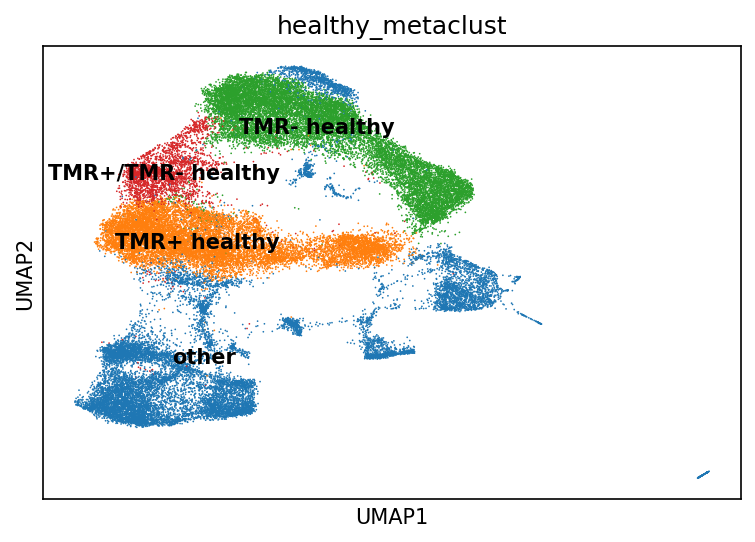

In [197]:
scanpy.pl.umap(adata, color=['healthy_metaclust'], legend_loc='on data')

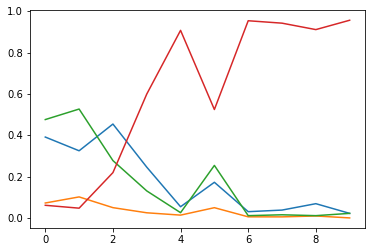

In [74]:
tmp_df = adata.obs.groupby(["meta_group", "healthy_metaclust"]).size() / adata.obs.groupby(["meta_group"]).size()

fig, ax = plt.subplots()
for idx, gdf in tmp_df.groupby(level="healthy_metaclust"):
    ax.plot(gdf.index.get_level_values("meta_group"), gdf.values)

<AxesSubplot:xlabel='meta_group', ylabel='count'>

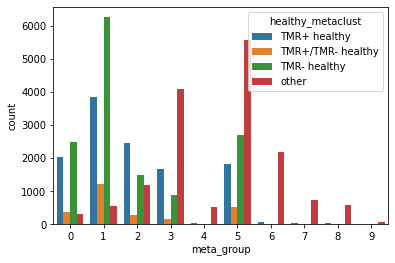

In [67]:
seaborn.countplot(data=adata.obs, x="meta_group", hue="healthy_metaclust")

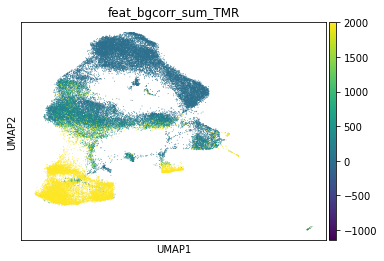

In [57]:
scanpy.pl.umap(adata, color=['feat_bgcorr_sum_TMR'], legend_loc='on data', vmax=2000)

In [56]:
numpy.save(data_dir / "indices/healthy_metaclust_full_spec.npy", adata.obs["healthy_metaclust"])

#### Why are cells clustered in the TMR-/TMR+ healthy cluster?

In [85]:
X = adata[adata.obs.healthy_metaclust != "other", adata.var.selected_corr].to_df()
y = adata[adata.obs.healthy_metaclust != "other", adata.var.selected_corr].obs["healthy_metaclust"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, stratify=y)

rf = RandomForestClassifier(n_estimators = 100, oob_score=True).fit(X_train, y_train)
metrics.balanced_accuracy_score(rf.predict(X_test), y_test)

0.9565652856497806

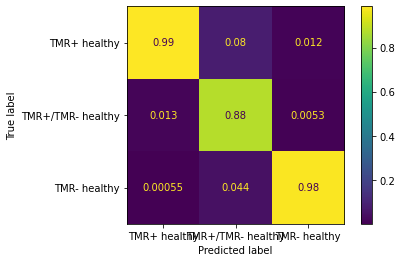

In [133]:
metrics.ConfusionMatrixDisplay.from_predictions(rf.predict(X_test), y_test, normalize="pred")

In [157]:
from shap.plots import beeswarm, scatter

In [142]:
numpy.random.seed(0)
explainer = shap.TreeExplainer(rf)
shap_values = explainer(X_test)

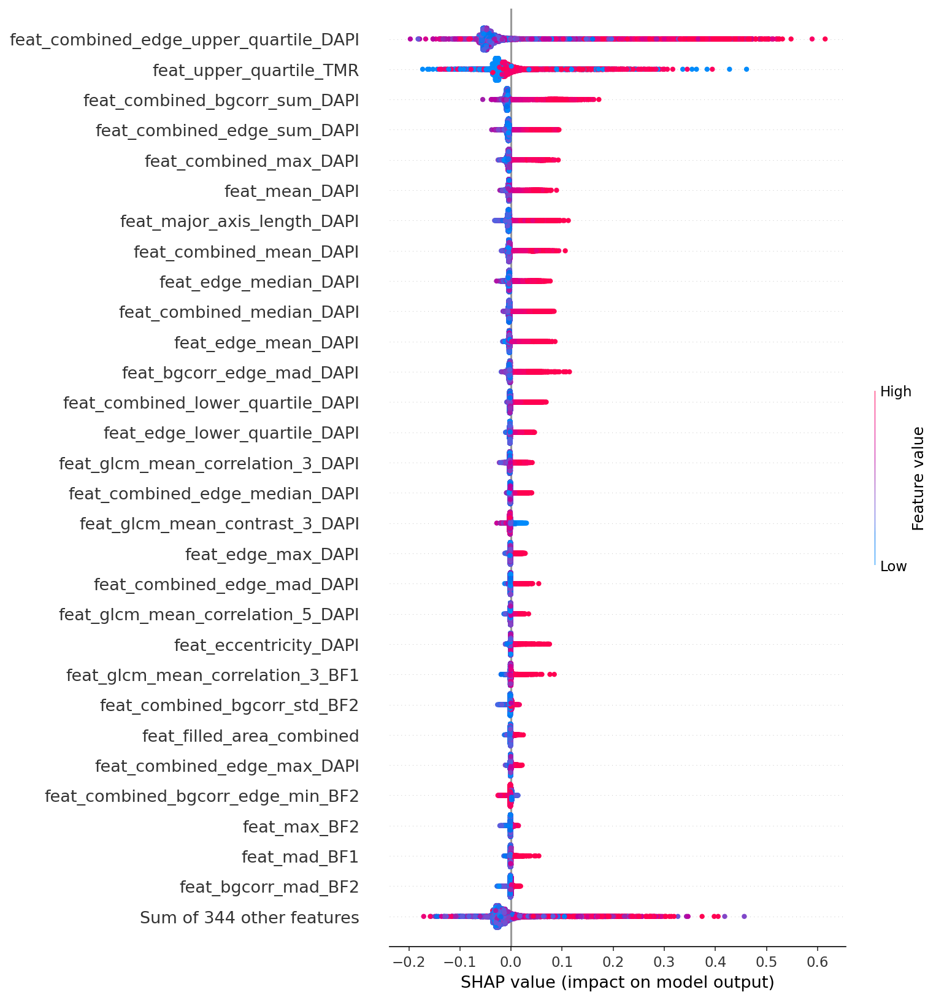

In [202]:
beeswarm(shap_values[..., 1], max_display=30)

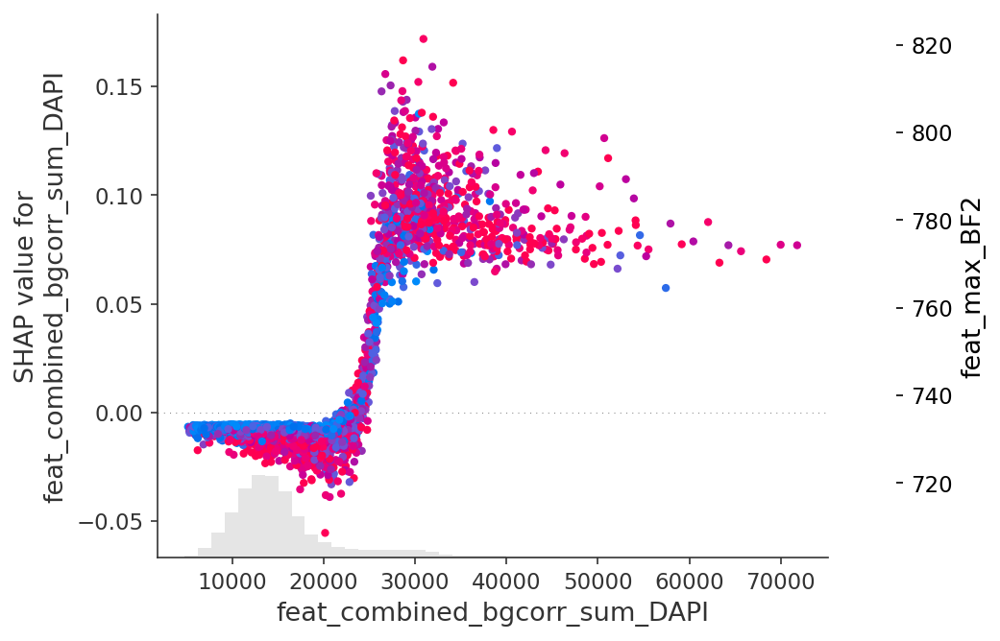

In [200]:
scatter(shap_values[:, "feat_combined_bgcorr_sum_DAPI", 1], color=shap_values[..., 1])

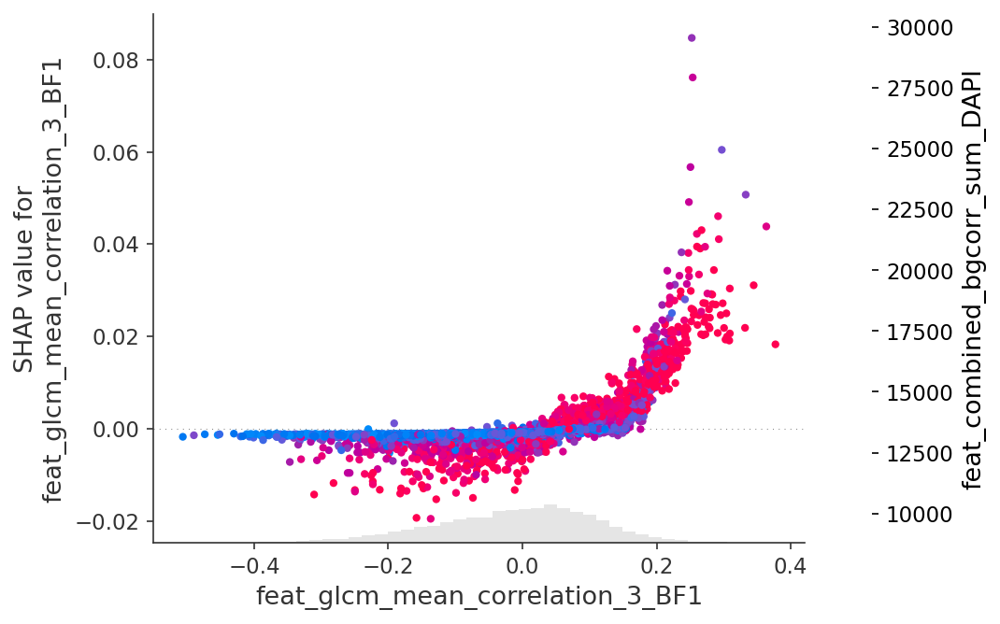

In [203]:
scatter(shap_values[:, "feat_glcm_mean_correlation_3_BF1", 1], color=shap_values[..., 1])

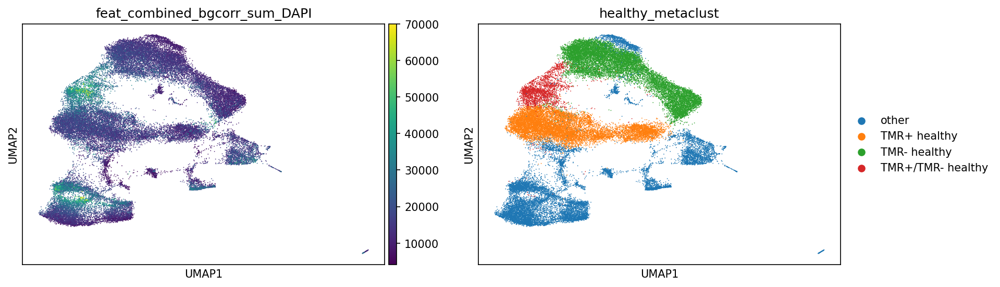

In [199]:
scanpy.pl.umap(adata, color=['feat_combined_bgcorr_sum_DAPI', 'healthy_metaclust'], vmax=70000)

### Cell cycle trajectory

In [ ]:
scanpy.pl.umap(adata, color=["leiden", "meta_label"], legend_loc="on data")

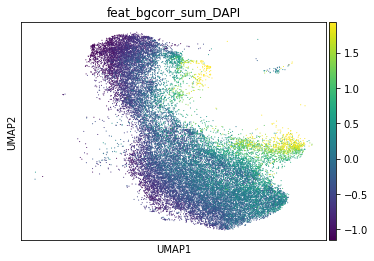

In [268]:
qq = numpy.quantile(adata3[adata3.obs["healthy_clust"] == 1, "feat_bgcorr_sum_DAPI"].X.ravel(), (0.01, 0.99))
scanpy.pl.umap(adata3[adata3.obs["healthy_clust"] == 1], color=["feat_bgcorr_sum_DAPI"], vmin=qq[0], vmax=qq[1])

All-NaN slice encountered
All-NaN slice encountered


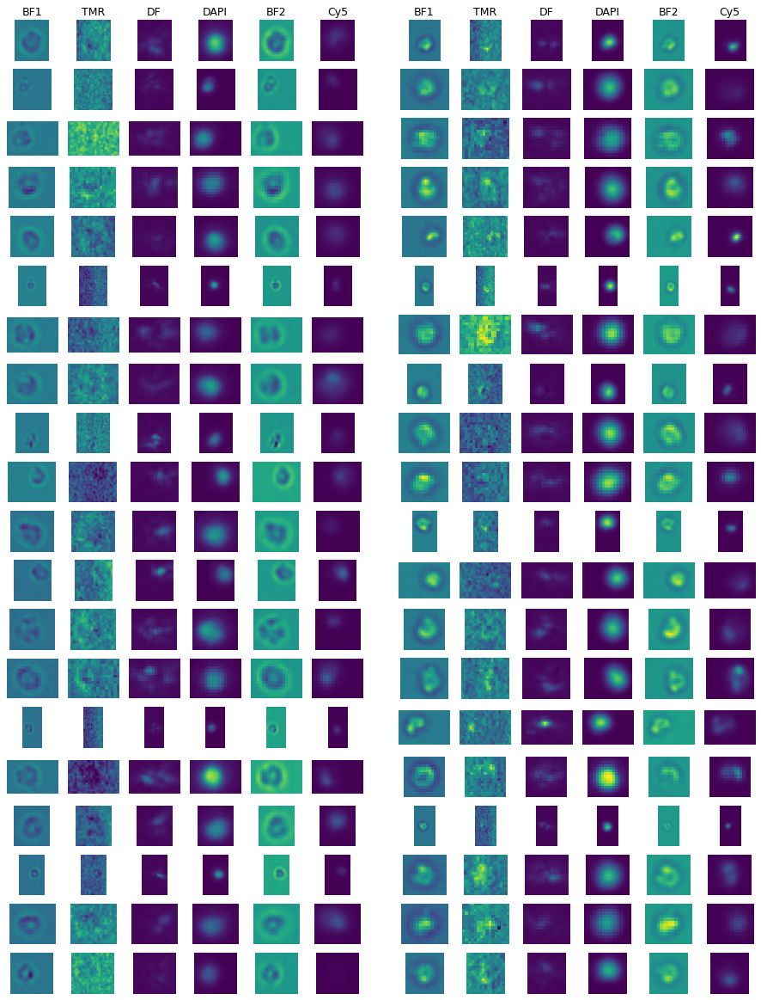

In [157]:
sel_edge_low = sel1 & (df["feat_bgcorr_edge_lower_quartile_BF1"] < -40)
sel_edge_high = sel1 & (df["feat_bgcorr_edge_lower_quartile_BF1"] > 0)
plot_gate_zarr_channels([sel_edge_high, sel_edge_low], df, maxn=20, smooth=1, mask=False, channel_ind=[0,1,3,4,5,6], channel_names=["BF1", "TMR", "DF", "DAPI", "BF2", "Cy5"])

In [278]:
%%time
sel = adata3.obs["louvain"].isin(["2", "3"])
target = adata3.obs["louvain"][sel] == "2"

mi3 = mutual_info_classif(adata3[sel].X, target, n_neighbors=10, random_state=0)
mi3 = pandas.Series(mi3, index=selected_mi).sort_values()
mi3.tail(n=20)

CPU times: user 3.17 s, sys: 882 µs, total: 3.17 s
Wall time: 3.18 s


feat_combined_max_DAPI                     0.416466
feat_combined_edge_std_DAPI                0.423778
feat_bgcorr_max_DAPI                       0.426179
feat_combined_sobel_mean_DAPI              0.426664
feat_bgcorr_upper_quartile_BF1             0.430218
feat_bgcorr_edge_mad_DAPI                  0.471485
feat_combined_median_BF2                   0.477454
feat_combined_std_BF1                      0.527114
feat_combined_upper_quartile_BF2           0.530208
feat_combined_bgcorr_upper_quartile_BF2    0.570493
feat_combined_edge_lower_quartile_BF2      0.592663
feat_bgcorr_mean_BF1                       0.609142
feat_combined_edge_upper_quartile_BF2      0.609818
feat_combined_bgcorr_lower_quartile_BF1    0.647795
feat_edge_upper_quartile_BF2               0.686083
feat_combined_skewness_BF2                 0.686579
feat_bgcorr_edge_upper_quartile_BF2        0.687571
feat_bgcorr_edge_lower_quartile_BF1        0.688259
feat_combined_bgcorr_edge_sum_BF1          0.689560
feat_combine

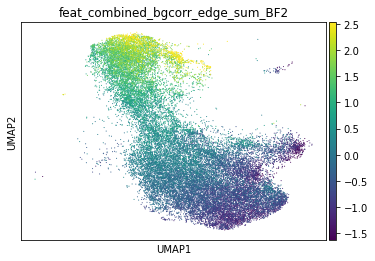

In [279]:
qq = numpy.quantile(adata3[adata3.obs["healthy_clust"] == 1, "feat_combined_bgcorr_edge_sum_BF2"].X.ravel(), (0.01, 0.99))
scanpy.pl.umap(adata3[adata3.obs["healthy_clust"] == 1], color=["feat_combined_bgcorr_edge_sum_BF2"], vmin=qq[0], vmax=qq[1])

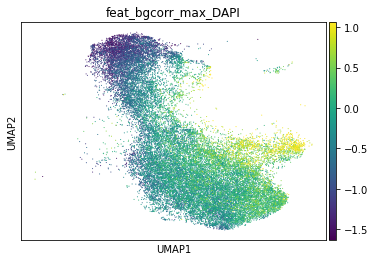

In [280]:
qq = numpy.quantile(adata3[adata3.obs["healthy_clust"] == 1, "feat_bgcorr_max_DAPI"].X.ravel(), (0.01, 0.99))
scanpy.pl.umap(adata3[adata3.obs["healthy_clust"] == 1], color=["feat_bgcorr_max_DAPI"], vmin=qq[0], vmax=qq[1])

## Trajectory analysis

In [306]:
%%time
scanpy.tl.diffmap(adata3)

CPU times: user 1.54 s, sys: 139 ms, total: 1.68 s
Wall time: 1.7 s


In [314]:
adata3.uns['iroot'] = numpy.flatnonzero(adata3.obs["louvain"] == "2")[0]

In [334]:
scanpy.tl.dpt(adata3, n_branchings=1)

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


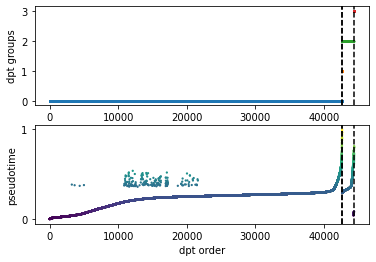

In [336]:
scanpy.pl.dpt_groups_pseudotime(adata3)

In [339]:
adata3.obs["dpt_groups"].unique()

['0', '2', '3', '1']
Categories (4, object): ['0', '1', '2', '3']

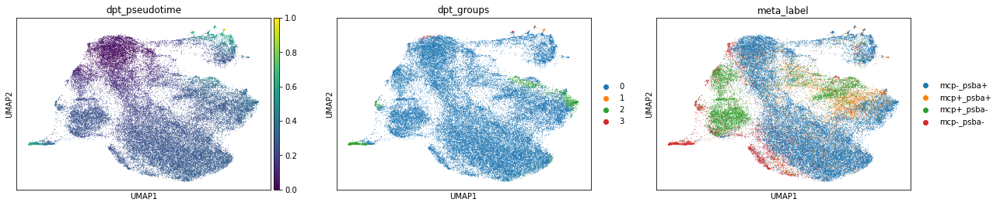

In [340]:
scanpy.pl.umap(adata3, color=["dpt_pseudotime", "dpt_groups", "meta_label"])

## Export

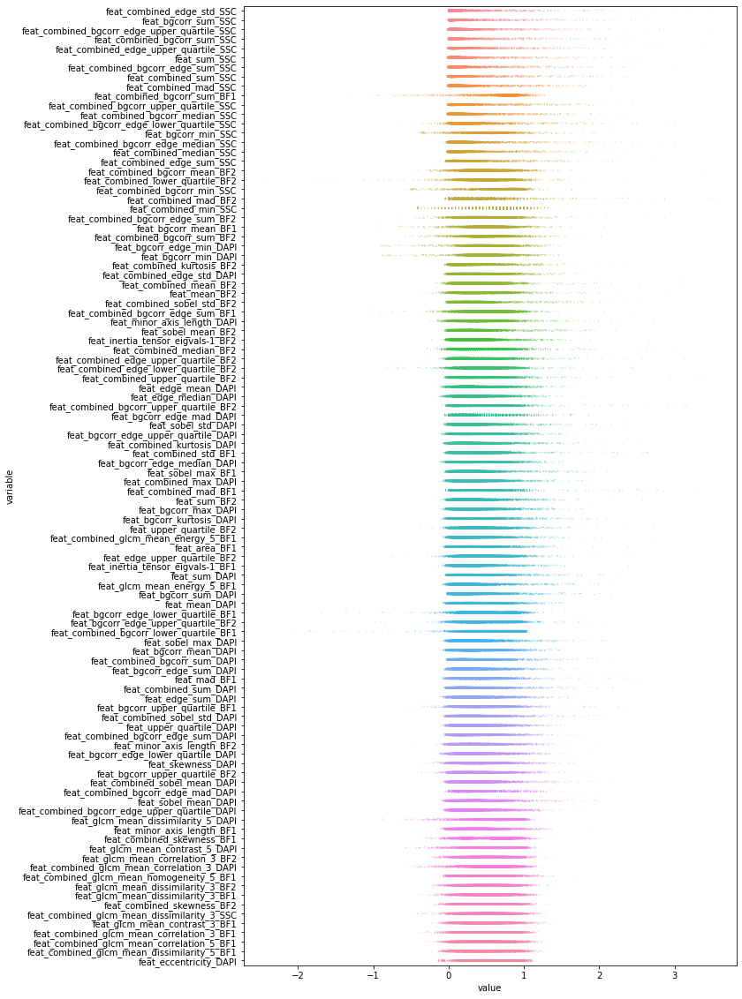

In [115]:
_ = normalization.dists(mm_df[selected_mi])

In [36]:
numpy.save(data_dir / "indices/cluster_index.npy", mm_df[selected_mi][~sel_stationary].index)

In [35]:
df.head()

meta_path  \
meta_type meta_object_number meta_replicate meta_suffix meta_group                                                      
Ctrl      21766              3              NaN         5           /data/gent/vo/000/gvo00070/vsc42015/datasets/w...   
          19432              3              NaN         5           /data/gent/vo/000/gvo00070/vsc42015/datasets/w...   
          16719              3              NaN         5           /data/gent/vo/000/gvo00070/vsc42015/datasets/w...   
          19692              3              NaN         5           /data/gent/vo/000/gvo00070/vsc42015/datasets/w...   
          17745              3              NaN         5           /data/gent/vo/000/gvo00070/vsc42015/datasets/w...   

                                                                    meta_zarr_idx  \
meta_type meta_object_number meta_replicate meta_suffix meta_group                  
Ctrl      21766              3              NaN         5                    1000   
          19432              3              NaN         5                    1001   
          16719              3              NaN         5                    1002   
          19692              3              NaN         5                    1003   
          17745              3              NaN         5                    1005   

                                                                    meta_bbox_minr  \
meta_type meta_object_number meta_replicate meta_suffix meta_group                   
Ctrl      21766              3              NaN         5                      3.0   
          19432              3              NaN         5                      3.0   
          16719              3              NaN         5                      1.0   
          19692              3              NaN         5                     12.0   
          17745              3              NaN         5                      0.0   

                                                                    meta_bbox_minc  \
meta_type meta_object_number meta_replicate meta_suffix meta_group                   
Ctrl      21766              3              NaN         5                      8.0   
          19432              3              NaN         5                      6.0   
          16719              3              NaN         5                     10.0   
          19692              3              NaN         5                      7.0   
          17745              3              NaN         5                      2.0   

                                                                    meta_bbox_maxr  \
meta_type meta_object_number meta_replicate meta_suffix meta_group                   
Ctrl      21766              3              NaN         5                     44.0   
          19432              3              NaN         5                     28.0   
          16719              3              NaN         5                     47.0   
          19692              3              NaN         5                     26.0   
          17745              3              NaN         5                     35.0   

                                                                    meta_bbox_maxc  \
meta_type meta_object_number meta_replicate meta_suffix meta_group                   
Ctrl      21766              3              NaN         5                     31.0   
          19432              3              NaN         5                     23.0   
          16719              3              NaN         5                     47.0   
          19692              3              NaN         5                     23.0   
          17745              3              NaN         5                     26.0   

                                                                    meta_regions_BF1  \
meta_type meta_object_number meta_replicate meta_suffix meta_group                     
Ctrl      21766              3              NaN         5                   

In [116]:
# flowsom

out_df2 = mm_df[selected_mi][~sel_stationary].copy()
out_df2["meta_label"] = df["meta_label"]
out_df2.reset_index().to_feather(path=data_dir / "cells_scaled.feather")

In [117]:
%%time
pca = PCA(n_components=0.95).fit_transform(mm_df[selected_mi][~sel_stationary])

CPU times: user 454 ms, sys: 34.8 ms, total: 489 ms
Wall time: 491 ms


In [118]:
slingshot_df = pandas.DataFrame(
    data=numpy.hstack([pca, umap2_[~sel_stationary]]),
    columns=[f"pca_{i}" for i in range(len(pca.T))] + [f"umap_{i}" for i in range(len(umap2_.T))]
)

In [119]:
slingshot_df.to_feather(data_dir / "slingshot.feather")

## Plots

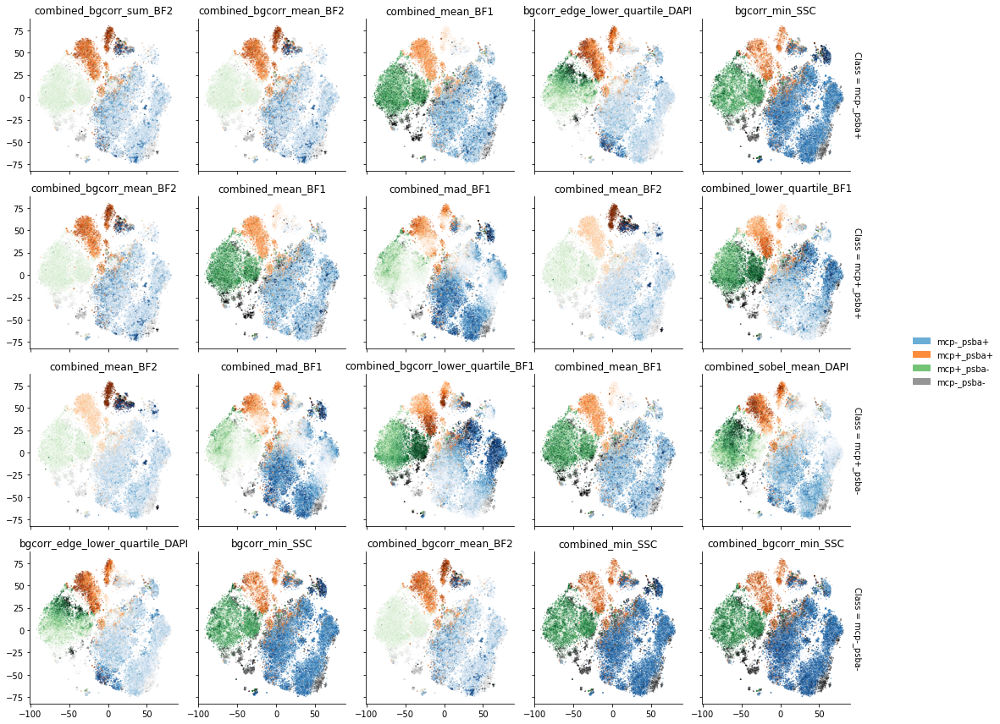

In [106]:
import matplotlib.patches as mpatches

def draw_dimred(data, x, *args, **kwargs):
    f = data[x].iloc[0][len("scip_"):]
    ax = plt.gca()
    norm = matplotlib.colors.Normalize(vmin=df.loc["Inf"][f].quantile(0.05), vmax=df.loc["Inf"][f].quantile(0.95))
    
    for cat, cmap in zip(df["meta_label"].cat.categories, ["Blues", "Oranges", "Greens", "Greys"]):
        sel = df.loc["Inf"]["meta_label"] == cat
        ax.scatter(x=tsne[sel, 0], y=tsne[sel, 1], cmap=cmap, norm=norm, c=df.loc["Inf"][sel][f], s=0.1, alpha=0.5)

grid = seaborn.FacetGrid(data=top5, row="Class", col="Rank", margin_titles=True)

legend_data = {}
for cat, cmap in zip(df["meta_label"].cat.categories, ["Blues", "Oranges", "Greens", "Greys"]):
    legend_data[cat] = mpatches.Patch(color=plt.get_cmap(cmap)(0.5), label=cat)
grid.add_legend(legend_data=legend_data)

grid.map_dataframe(draw_dimred, x="Feature")
for (c, r), ax in grid.axes_dict.items():
    f = top5.set_index(["Class", "Rank"]).loc[c, r]["Feature"]
    ax.set_title(f[len("scip_feat_"):])
    
grid.set_xlabels("")
grid.tight_layout()

plt.savefig(data_dir / "figures/tsne_color_top5_shap.png", bbox_inches="tight", dpi=150)

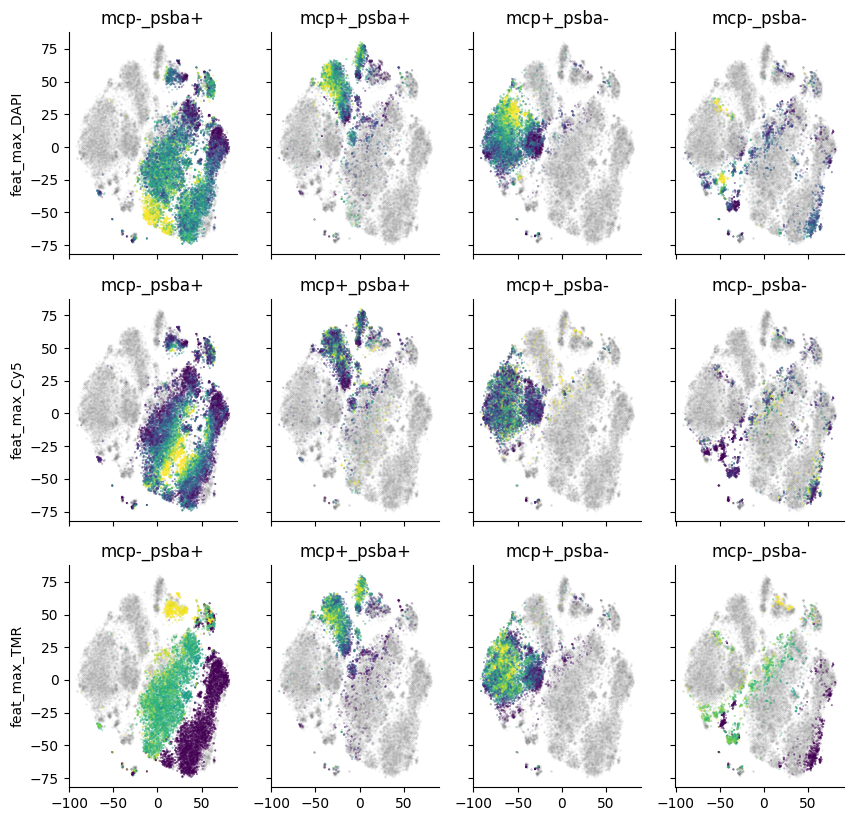

In [107]:
fig, axes = plt.subplots(3, 4, dpi=100, figsize=(10, 10), sharex=True, sharey=True)

for f, row in zip(["feat_max_DAPI", "feat_max_Cy5", "feat_max_TMR"], axes):

    row[0].set_ylabel(f)
    for ax, cat in zip(row, df["meta_label"].cat.categories):
        sel = df.loc["Inf"]["meta_label"] == cat
        norm = matplotlib.colors.Normalize(vmin=df.loc["Inf"][sel][f].quantile(0.05), vmax=df.loc["Inf"][sel][f].quantile(0.95))
        ax.scatter(x=tsne[~sel, 0], y=tsne[~sel, 1], c="grey", s=0.1, alpha=0.1)
        ax.scatter(x=tsne[sel, 0], y=tsne[sel, 1], cmap="viridis", norm=norm, c=df.loc["Inf"][sel][f], s=0.1, alpha=0.5)
        ax.set_title(cat)

seaborn.despine(fig)

plt.savefig(data_dir / "figures/tsne_color_fluor.png", bbox_inches="tight", dpi=150)

All-NaN slice encountered
All-NaN slice encountered


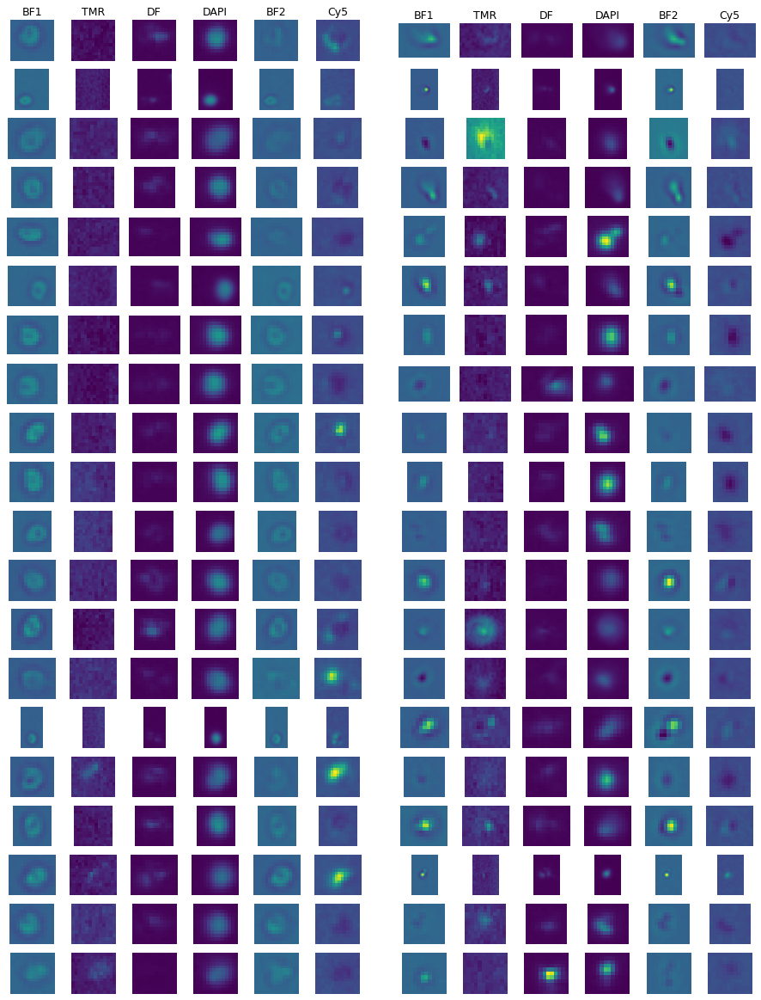

In [117]:
sel_diss_low = (df["feat_combined_glcm_mean_homogeneity_5_BF1"] < 0.25) & sel5
sel_diss_high = (df["feat_combined_glcm_mean_homogeneity_5_BF1"] > .4) & (sel1 | sel2 | sel3)
plot_gate_zarr_channels([sel_diss_low, sel_diss_high], df, maxn=20, smooth=1, mask=False, channel_ind=[0,1,3,4,5,6], channel_names=["BF1", "TMR", "DF", "DAPI", "BF2", "Cy5"])